In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

In [2]:
import addict
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

import celeri

# Read data and pre-process

In [3]:
COMMAND_FILE_NAME = "../data/command/japan_command_cmi_coupling.json"
command = celeri.get_command(COMMAND_FILE_NAME)
celeri.create_output_folder(command)
logger = celeri.get_logger(command)
segment, block, meshes, station, mogi, sar = celeri.read_data(command)
station = celeri.process_station(station, command)
segment = celeri.process_segment(segment, command, meshes)
sar = celeri.process_sar(sar, command)
closure, block = celeri.assign_block_labels(segment, station, block, mogi, sar)
assembly = addict.Dict()
operators = addict.Dict()
operators.meshes = [addict.Dict()] * len(meshes)
assembly = celeri.merge_geodetic_data(assembly, station, sar)

INFO: Read: ../data/command/japan_command_cmi_coupling.json - celeri.celeri:get_logger:7560 - 2024-11-17 17:36:57
INFO: RUN_NAME: 0000000519 - celeri.celeri:get_logger:7561 - 2024-11-17 17:36:57
INFO: Write log file: ../runs/0000000519/0000000519.log - celeri.celeri:get_logger:7562 - 2024-11-17 17:36:57
INFO: Reading data files - celeri.celeri:read_data:451 - 2024-11-17 17:36:57
SUCCESS: Read: ../data/segment/qp_japan_segment.csv - celeri.celeri:read_data:455 - 2024-11-17 17:36:57
SUCCESS: Read: ../data/block/japan_block.csv - celeri.celeri:read_data:460 - 2024-11-17 17:36:57
SUCCESS: Read: ../data/mesh/japan_mesh_parameters_cmi_coupling.json - celeri.celeri:read_data:467 - 2024-11-17 17:36:57

SUCCESS: Read: ../data/mesh/nankai.msh - celeri.celeri:read_mesh:446 - 2024-11-17 17:36:57

SUCCESS: Read: ../data/mesh/japan.msh - celeri.celeri:read_mesh:446 - 2024-11-17 17:36:57

SUCCESS: Read: ../data/mesh/sagami.msh - celeri.celeri:read_mesh:446 - 2024-11-17 17:36:57

SUCCESS: Read: ../dat

# Generate all operators, weighting, and data vector for KL+QP problem

In [4]:
# Get all elastic operators for segments and TDEs
celeri.get_elastic_operators(operators, meshes, segment, station, command)

# Get TDE smoothing operators
celeri.get_all_mesh_smoothing_matrices(meshes, operators)

# Block rotation to velocity operator
operators.rotation_to_velocities = celeri.get_rotation_to_velocities_partials(
    station, len(block)
)

# Soft block motion constraints
assembly, operators.block_motion_constraints = celeri.get_block_motion_constraints(
    assembly, block, command
)

# Soft slip rate constraints
assembly, operators.slip_rate_constraints = celeri.get_slip_rate_constraints(
    assembly, segment, block, command
)

# Rotation vectors to slip rate operator
operators.rotation_to_slip_rate = celeri.get_rotation_to_slip_rate_partials(
    segment, block
)

# Internal block strain rate operator
(
    operators.block_strain_rate_to_velocities,
    strain_rate_block_index,
) = celeri.get_block_strain_rate_to_velocities_partials(block, station, segment)

# Mogi source operator
operators.mogi_to_velocities = celeri.get_mogi_to_velocities_partials(
    mogi, station, command
)

# Soft TDE boundary condition constraints
celeri.get_tde_slip_rate_constraints(meshes, operators)

# Get index
index = celeri.get_index_eigen(assembly, segment, station, block, meshes, mogi)

# Get data vector for KL problem
data_vector_eigen = celeri.get_data_vector_eigen(meshes, assembly, index)

# Get data vector for KL problem
weighting_vector_eigen = celeri.get_weighting_vector_eigen(
    command, station, meshes, index
)

# Get KL modes for each mesh
celeri.get_eigenvectors_to_tde_slip(operators, meshes)

# Get full operator including all blocks, KL modes, strain blocks, and mogis
operators.eigen = celeri.get_full_dense_operator_eigen(operators, meshes, index)

# Get rotation to TDE kinematic slip rate operator for all meshes tied to segments
celeri.get_tde_coupling_constraints(meshes, segment, block, operators)

INFO: Computing elastic operators - celeri.celeri:get_elastic_operators:2053 - 2024-11-17 17:36:57


Calculating Okada partials for segments: 100%|██████████| 481/481 [00:04<00:00, 115.92it/s]


INFO: Start: TDE slip to velocity calculation for mesh: ../data/mesh/nankai.msh - celeri.celeri:get_elastic_operators:2061 - 2024-11-17 17:37:01


Calculating cutde partials for triangles: 100%|██████████| 1902/1902 [00:06<00:00, 313.18it/s]


SUCCESS: Finish: TDE slip to velocity calculation for mesh: ../data/mesh/nankai.msh - celeri.celeri:get_elastic_operators:2067 - 2024-11-17 17:37:07
INFO: Start: TDE slip to velocity calculation for mesh: ../data/mesh/japan.msh - celeri.celeri:get_elastic_operators:2061 - 2024-11-17 17:37:07


Calculating cutde partials for triangles: 100%|██████████| 2621/2621 [00:08<00:00, 300.83it/s]


SUCCESS: Finish: TDE slip to velocity calculation for mesh: ../data/mesh/japan.msh - celeri.celeri:get_elastic_operators:2067 - 2024-11-17 17:37:16
INFO: Start: TDE slip to velocity calculation for mesh: ../data/mesh/sagami.msh - celeri.celeri:get_elastic_operators:2061 - 2024-11-17 17:37:16


Calculating cutde partials for triangles: 100%|██████████| 231/231 [00:00<00:00, 327.63it/s]


SUCCESS: Finish: TDE slip to velocity calculation for mesh: ../data/mesh/sagami.msh - celeri.celeri:get_elastic_operators:2067 - 2024-11-17 17:37:17
INFO: Start: TDE slip to velocity calculation for mesh: ../data/mesh/japan_mock_cmi.msh - celeri.celeri:get_elastic_operators:2061 - 2024-11-17 17:37:17


Calculating cutde partials for triangles: 100%|██████████| 76/76 [00:00<00:00, 302.50it/s]


SUCCESS: Finish: TDE slip to velocity calculation for mesh: ../data/mesh/japan_mock_cmi.msh - celeri.celeri:get_elastic_operators:2067 - 2024-11-17 17:37:17
INFO: No slip rate constraints - celeri.celeri:get_slip_rate_constraints:3356 - 2024-11-17 17:37:18
INFO: Start: Eigenvectors to TDE slip for mesh: ../data/mesh/nankai.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4456 - 2024-11-17 17:37:18
SUCCESS: Finish: Eigenvectors to TDE slip for mesh: ../data/mesh/nankai.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4485 - 2024-11-17 17:37:19
INFO: Start: Eigenvectors to TDE slip for mesh: ../data/mesh/japan.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4456 - 2024-11-17 17:37:19
SUCCESS: Finish: Eigenvectors to TDE slip for mesh: ../data/mesh/japan.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4485 - 2024-11-17 17:37:21
INFO: Start: Eigenvectors to TDE slip for mesh: ../data/mesh/sagami.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4456 - 2024-11-17 17:37:21
SUCCESS: Finish: 

# Solve bounded KL+QP problem

In [5]:
# Get QP bounds as inequality constraints
qp_inequality_constraints_matrix, qp_inequality_constraints_data_vector = (
    celeri.get_qp_all_inequality_operator_and_data_vector(
        index, meshes, operators, segment, block
    )
)

# QP solve
opts = {"show_progress": True}
solution_qp = celeri.lsqlin_qp(
    operators.eigen * np.sqrt(weighting_vector_eigen[:, None]),
    data_vector_eigen * np.sqrt(weighting_vector_eigen),
    0,
    qp_inequality_constraints_matrix,  # Inequality matrix
    qp_inequality_constraints_data_vector,  # Inequality data vector
    None,
    None,
    None,
    None,
    None,
    opts,
)


# Create estimation data structure and calculate derived quantities
estimation_qp = addict.Dict()
estimation_qp.state_vector = np.array(solution_qp["x"]).flatten()
estimation_qp.operator = operators.eigen
celeri.post_process_estimation_eigen(estimation_qp, operators, station, index)
celeri.write_output(command, estimation_qp, station, segment, block, meshes)

INFO: No hard slip rate bounds - celeri.celeri:get_slip_rate_bounds:4153 - 2024-11-17 17:37:22
     pcost       dcost       gap    pres   dres
 0: -2.9918e+04 -3.4698e+07  3e+07  2e-17  2e-15
 1: -4.4283e+04 -8.3736e+06  8e+06  3e-16  1e-15
 2: -4.4008e+04 -7.9965e+06  8e+06  3e-16  8e-16
 3: -4.4315e+04 -1.4707e+06  1e+06  3e-16  5e-16
 4: -4.6935e+04 -2.3546e+05  2e+05  3e-16  5e-16
 5: -4.9022e+04 -7.2078e+04  2e+04  3e-16  6e-16
 6: -5.0030e+04 -5.3424e+04  3e+03  3e-16  7e-16
 7: -5.0323e+04 -5.1166e+04  8e+02  3e-16  9e-16
 8: -5.0407e+04 -5.0735e+04  3e+02  3e-16  6e-16
 9: -5.0426e+04 -5.0647e+04  2e+02  3e-16  7e-16
10: -5.0439e+04 -5.0550e+04  1e+02  3e-16  5e-16
11: -5.0441e+04 -5.0521e+04  8e+01  3e-16  6e-16
12: -5.0444e+04 -5.0485e+04  4e+01  3e-16  6e-16
13: -5.0445e+04 -5.0463e+04  2e+01  3e-16  6e-16
14: -5.0445e+04 -5.0455e+04  1e+01  3e-16  5e-16
15: -5.0446e+04 -5.0450e+04  5e+00  3e-16  6e-16
16: -5.0446e+04 -5.0448e+04  2e+00  3e-16  5e-16
17: -5.0446e+04 -5.0447e

# Plot KL+QP estimation

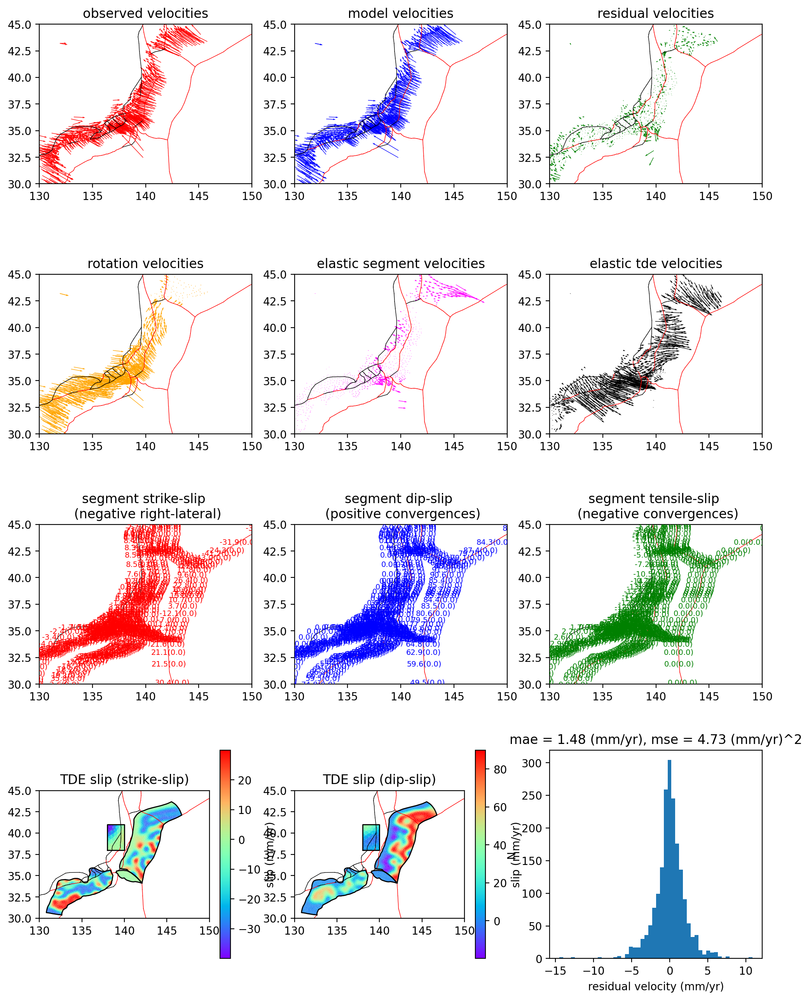

SUCCESS: Wrote figures../runs/0000000519/plot_estimation_summary.(pdf, png) - celeri.celeri:plot_estimation_summary:6601 - 2024-11-17 17:37:27


<Figure size 640x480 with 0 Axes>

In [6]:
celeri.plot_estimation_summary(
    command,
    segment,
    station,
    meshes,
    estimation_qp,
    lon_range=command.lon_range,
    lat_range=command.lat_range,
    quiver_scale=command.quiver_scale,
)

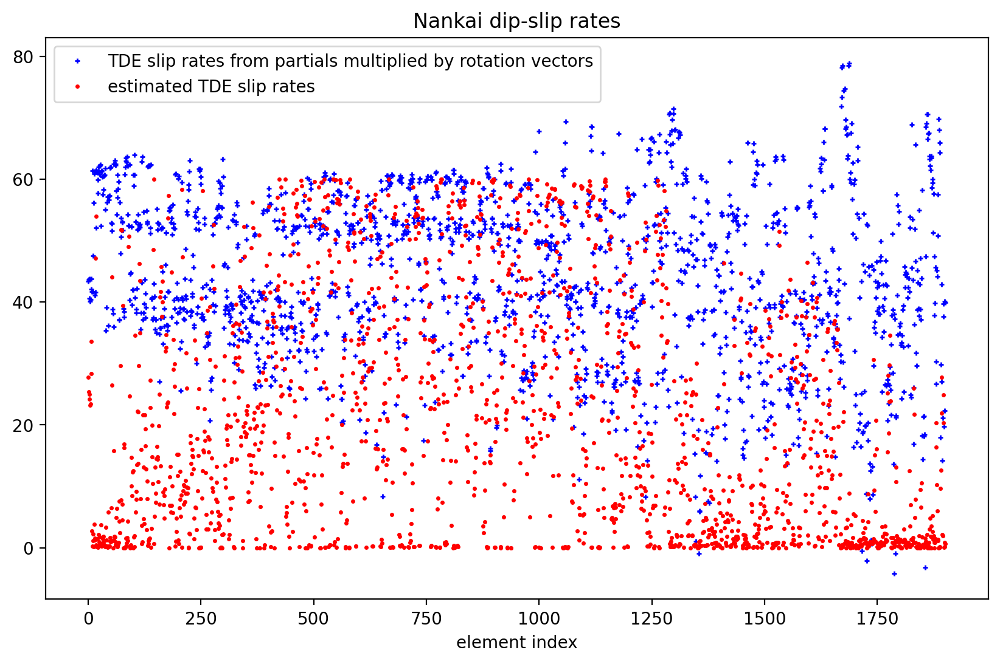

Text(0.5, 1.0, 'strike-slip (elastic)')

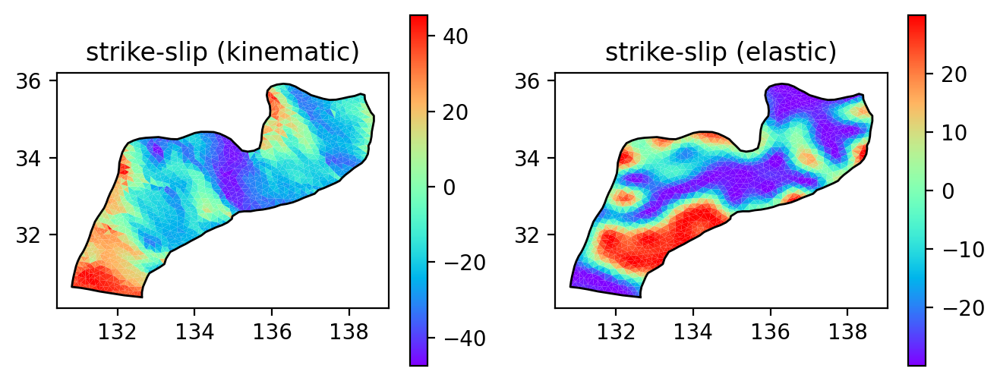

In [7]:
len(estimation_qp.state_vector)

# Multiply rotation vector components by TDE slip rate partials
jpl = (
    operators.rotation_to_tri_slip_rate[0]
    @ estimation_qp.state_vector[0 : 3 * len(block)]
)

# Multiply eigen modes by eigen to TDE matrix

bjm = (
    operators.eigenvectors_to_tde_slip[0]
    @ estimation_qp.state_vector[
        3 * len(block) : 3 * len(block)
        + (meshes[0].n_modes_strike_slip + meshes[0].n_modes_dip_slip)
    ]
)


plt.figure(figsize=(10, 6))
plt.plot(
    jpl[1::2],
    "+b",
    markersize=3,
    label="TDE slip rates from partials multiplied by rotation vectors",
)
plt.plot(bjm[1::2], ".r", markersize=3, label="estimated TDE slip rates")
plt.xlabel("element index")
plt.title("Nankai dip-slip rates")
plt.legend()
plt.show()


def plot_mesh(meshes, fill_value, ax):
    x_coords = meshes.points[:, 0]
    y_coords = meshes.points[:, 1]
    vertex_array = np.asarray(meshes.verts)

    if not ax:
        ax = plt.gca()
    xy = np.c_[x_coords, y_coords]
    verts = xy[vertex_array]
    pc = matplotlib.collections.PolyCollection(verts, edgecolor="none", cmap="rainbow")
    pc.set_array(fill_value)
    ax.add_collection(pc)
    ax.autoscale()
    plt.colorbar(pc)

    # Add mesh edge
    x_edge = x_coords[meshes.ordered_edge_nodes[:, 0]]
    y_edge = y_coords[meshes.ordered_edge_nodes[:, 0]]
    x_edge = np.append(x_edge, x_coords[meshes.ordered_edge_nodes[0, 0]])
    y_edge = np.append(y_edge, y_coords[meshes.ordered_edge_nodes[0, 0]])
    plt.plot(x_edge, y_edge, color="black", linewidth=1)
    plt.gca().set_aspect("equal")


plt.figure(figsize=(12, 3))
plt.subplot(1, 3, 1)
plot_mesh(meshes[0], jpl[0::2], plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

# Correct coupling calculation

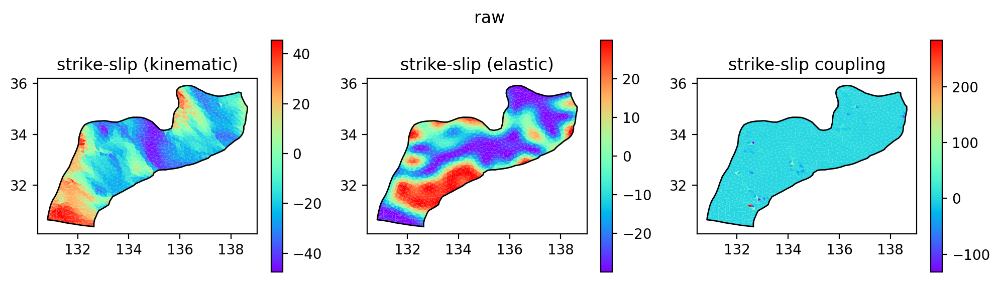

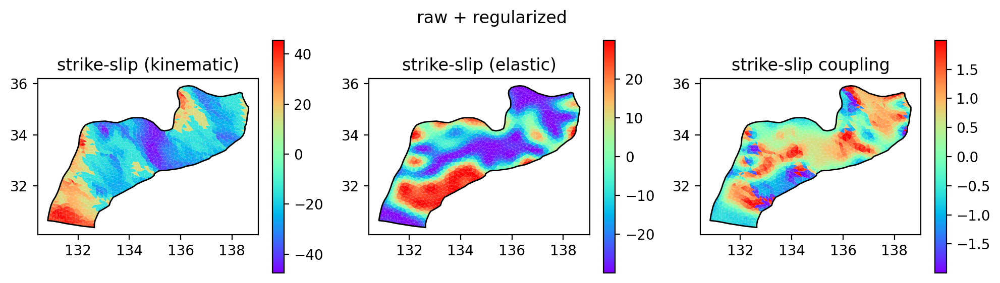

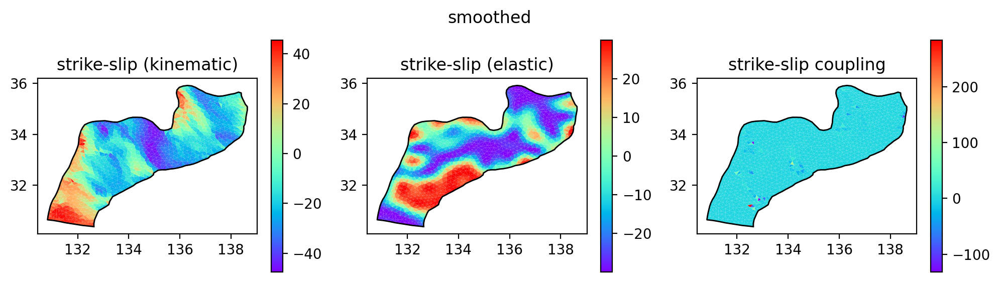

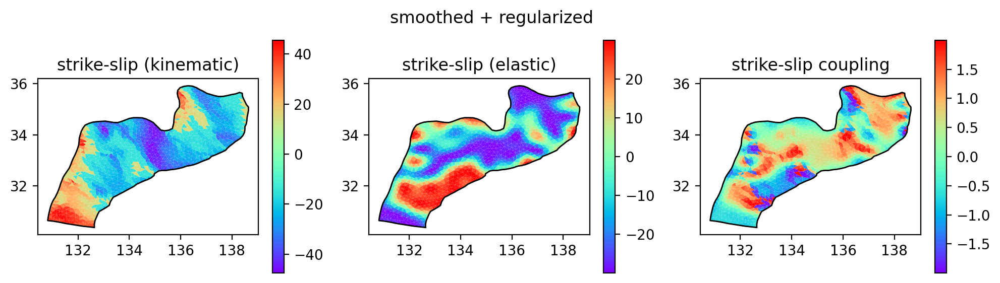

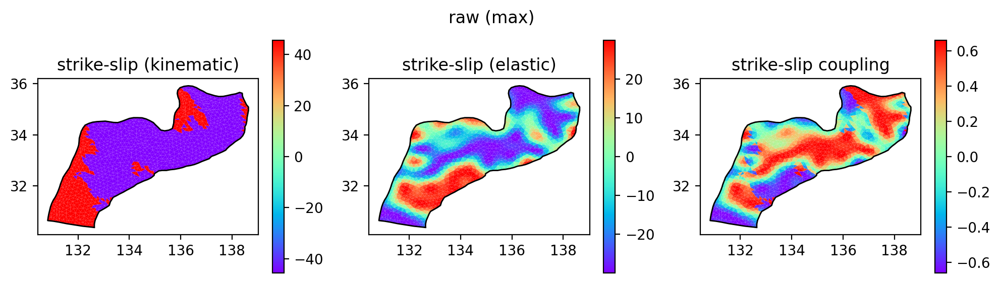

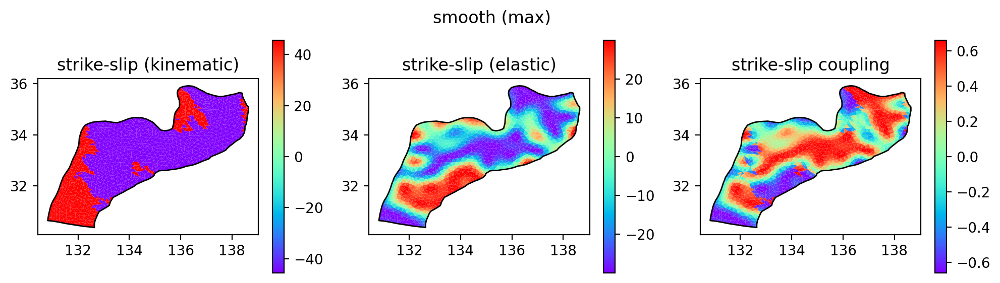

In [8]:
def smooth_irregular_data(x_coords, y_coords, values, length_scale):
    # Build a KDTree for efficient neighbor searching
    points = np.vstack((x_coords, y_coords)).T
    tree = cKDTree(points)

    # Prepare an array to store the smoothed values
    smoothed_values = np.zeros_like(values)

    # Smoothing calculation
    for i, point in enumerate(points):
        # Find neighbors within 3 * length_scale for efficiency
        indices = tree.query_ball_point(point, 3 * length_scale)

        # Calculate distances and apply Gaussian weights
        distances = np.linalg.norm(points[indices] - point, axis=1)
        weights = np.exp(-(distances**2) / (2 * length_scale**2))

        # Weighted sum for smoothing
        smoothed_values[i] = np.sum(weights * values[indices]) / np.sum(weights)

    return smoothed_values


# Smooth kinematic smooth
jpl_ss_smooth = smooth_irregular_data(
    meshes[0].lon_centroid, meshes[0].lat_centroid, jpl[0::2], length_scale=0.01
)

jpl_ds_smooth = smooth_irregular_data(
    meshes[0].lon_centroid, meshes[0].lat_centroid, jpl[1::2], length_scale=0.01
)

coupling_ss = bjm[0::2] / jpl_ss_smooth

plt.figure(figsize=(12, 3))
plt.subplot(1, 3, 1)
plot_mesh(meshes[0], jpl[0::2], plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

plt.subplot(1, 3, 3)
plot_mesh(meshes[0], bjm[0::2] / jpl[0::2], plt.gca())
plt.title("strike-slip coupling")
plt.suptitle("raw")
plt.show()


plt.figure(figsize=(12, 3))
a = np.abs(jpl[0::2])
a[a < 15.0] = 15.0
a = a * np.sign(jpl[0::2])

plt.subplot(1, 3, 1)
plot_mesh(meshes[0], a, plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

plt.subplot(1, 3, 3)
plot_mesh(meshes[0], bjm[0::2] / a, plt.gca())
plt.title("strike-slip coupling")
plt.suptitle("raw + regularized")
plt.show()


plt.figure(figsize=(12, 3))
plt.subplot(1, 3, 1)
plot_mesh(meshes[0], jpl_ss_smooth, plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

plt.subplot(1, 3, 3)
a = np.abs(jpl_ss_smooth)
a = a * np.sign(jpl_ss_smooth)
plot_mesh(meshes[0], bjm[0::2] / a, plt.gca())
plt.title("strike-slip coupling")
plt.suptitle("smoothed")
plt.show()


plt.figure(figsize=(12, 3))
a = np.abs(jpl_ss_smooth)
a[a < 15.0] = 15.0
a = a * np.sign(jpl_ss_smooth)

plt.subplot(1, 3, 1)
plot_mesh(meshes[0], a, plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

plt.subplot(1, 3, 3)
plot_mesh(meshes[0], bjm[0::2] / a, plt.gca())
plt.title("strike-slip coupling")
plt.suptitle("smoothed + regularized")
plt.show()


plt.figure(figsize=(12, 3))
a = np.max(jpl[0::2])
a = a * np.sign(jpl[0::2])

plt.subplot(1, 3, 1)
plot_mesh(meshes[0], a, plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

plt.subplot(1, 3, 3)
plot_mesh(meshes[0], bjm[0::2] / a, plt.gca())
plt.title("strike-slip coupling")
plt.suptitle("raw (max)")
plt.show()


plt.figure(figsize=(12, 3))
a = np.max(jpl_ss_smooth)
a = a * np.sign(jpl_ss_smooth)

plt.subplot(1, 3, 1)
plot_mesh(meshes[0], a, plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

plt.subplot(1, 3, 3)
plot_mesh(meshes[0], bjm[0::2] / a, plt.gca())
plt.title("strike-slip coupling")
plt.suptitle("smooth (max)")
plt.show()

# Iterative approach to finding a solution within coupling bounds

INFO: 
ITERATION 0 - __main__:<module>:291 - 2024-11-17 17:37:29
INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:115 - 2024-11-17 17:37:29
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:118 - 2024-11-17 17:37:29
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 964 TDEs - __main__:check_coupling_bounds_single_mesh:146 - 2024-11-17 17:37:29
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 467 TDEs - __main__:check_coupling_bounds_single_mesh:149 - 2024-11-17 17:37:29
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:152 - 2024-11-17 17:37:29
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 326 TDEs - __main__:check_coupling_bounds_single_mesh:155 - 2024-11-17 17:37:29
INFO: TOTAL TDES OOB 1757 TDEs - __main__:check_coupling_bounds_single_mesh:158 - 2024-11-17 17:37:29
INFO: CONTINUE COUPLING RELAXATION ITERATION: True -

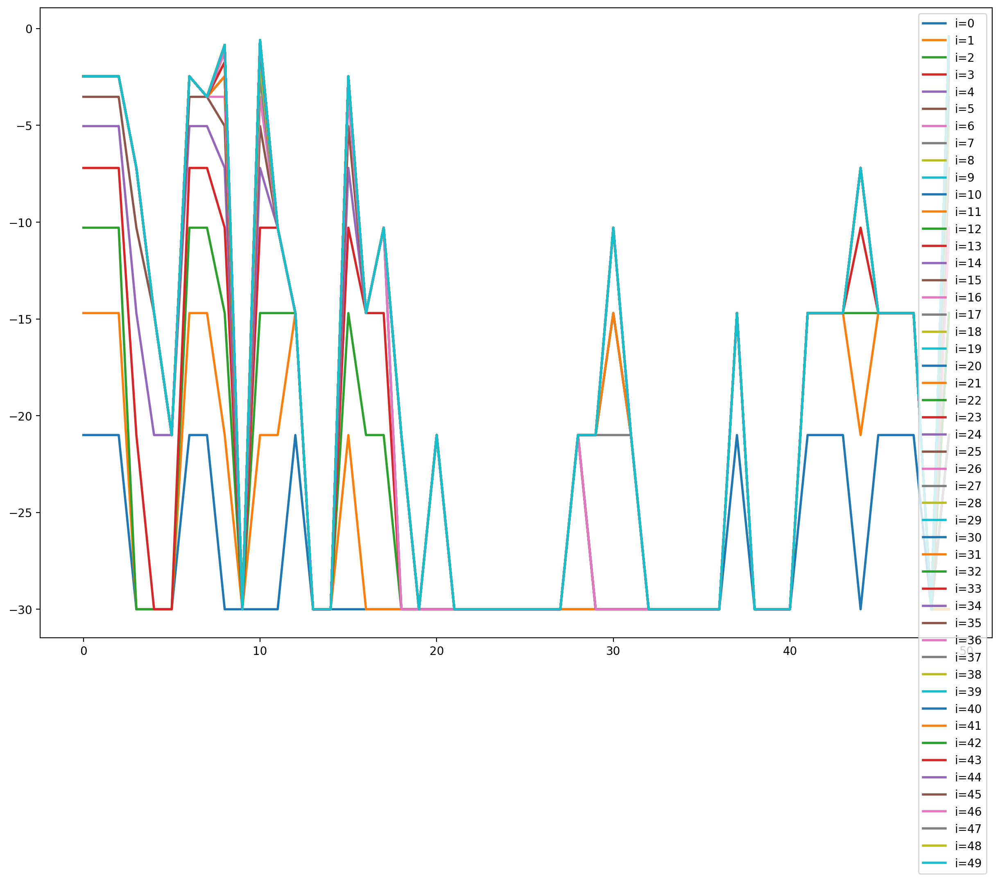

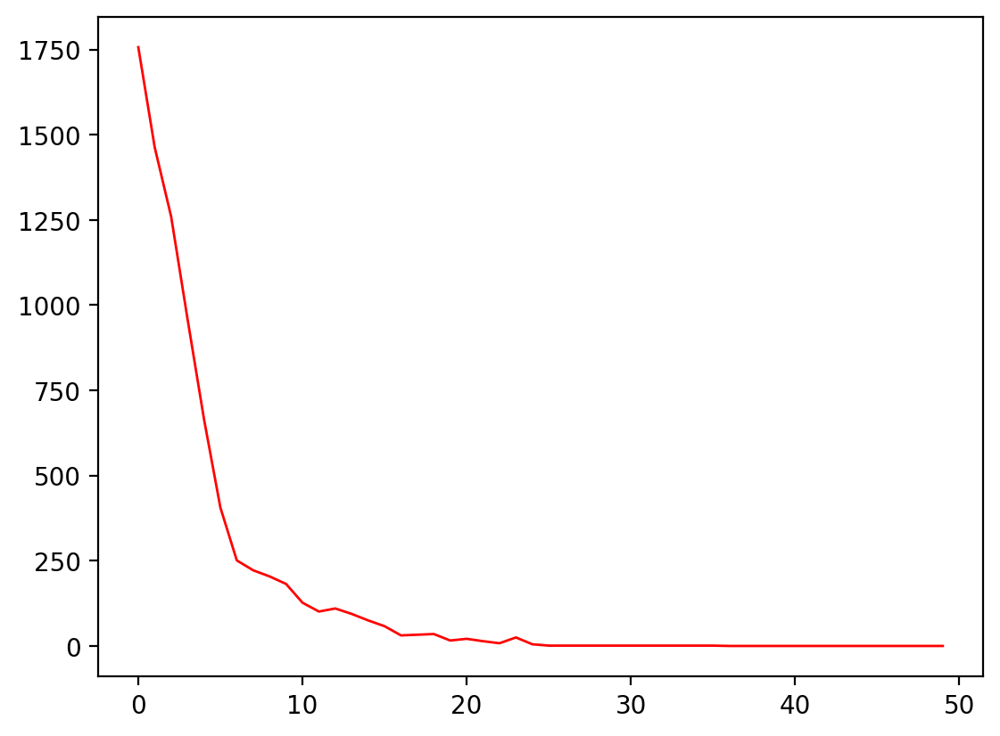

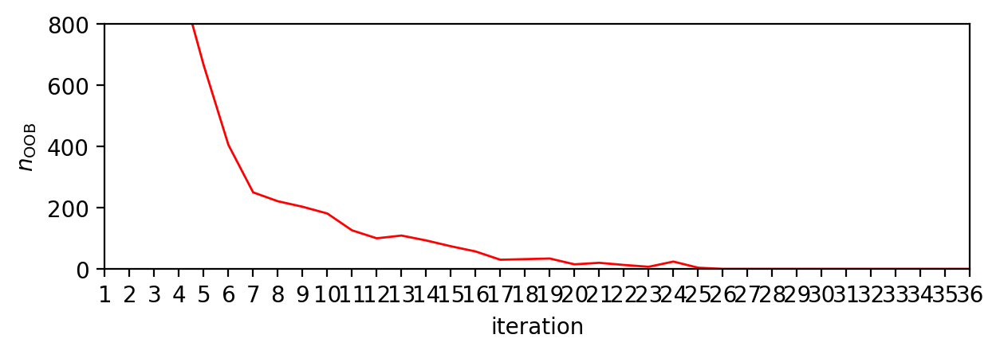

In [9]:
def check_coupling_bounds_single_mesh(
    meshes,
    mesh_idx,
    estimation_qp,
    current_ss_bounds_lower,
    current_ss_bounds_upper,
    current_ds_bounds_lower,
    current_ds_bounds_upper,
    debug_plot=False,
):
    """
    *mesh_parameter.json variable names for reference:

    TDE rate bounds:
    "qp_mesh_tde_bound": 1,
    "qp_mesh_tde_slip_rate_lower_bound_ss": -30,
    "qp_mesh_tde_slip_rate_upper_bound_ss": 30,
    "qp_mesh_tde_slip_rate_lower_bound_ds": 0,
    "qp_mesh_tde_slip_rate_upper_bound_ds": 60,

    TDE coupling bounds:
    "qp_mesh_tde_bound_coupling": 0,
    "qp_mesh_tde_slip_rate_lower_bound_ss_coupling": -0.5,
    "qp_mesh_tde_slip_rate_upper_bound_ss_coupling": 0.5,
    "qp_mesh_tde_slip_rate_lower_bound_ds_coupling": 0,
    "qp_mesh_tde_slip_rate_upper_bound_ds_coupling": 1,

    """

    # for i in range(np.max(segment.patch_file_name) + 1):
    # for i in range(1):
    # Calculate coupling for each non-CMI mesh

    # Multiply rotation vector components by TDE slip rate partials
    kinematic_tde_rates = (
        operators.rotation_to_tri_slip_rate[mesh_idx]
        @ estimation_qp.state_vector[0 : 3 * len(block)]
    )

    # Multiply eigen modes by eigen to TDE matrix
    estimated_tde_rates = (
        operators.eigenvectors_to_tde_slip[mesh_idx]
        @ estimation_qp.state_vector[
            3 * len(block) : 3 * len(block)
            + (meshes[mesh_idx].n_modes_strike_slip + meshes[mesh_idx].n_modes_dip_slip)
        ]  # TODO: Fix column indexing
    )

    #
    # Calculate coupling
    # - smoothed kinematic
    # - lower threshold for kinematic
    # TODO: Do I need a sign check?
    #

    # Smooth kinematic smooth
    kinematic_tde_rates_ss_smooth = smooth_irregular_data(
        meshes[mesh_idx].lon_centroid,
        meshes[mesh_idx].lat_centroid,
        kinematic_tde_rates[0::2],
        length_scale=0.01,
    )
    kinematic_tde_rates_ds_smooth = smooth_irregular_data(
        meshes[mesh_idx].lon_centroid,
        meshes[mesh_idx].lat_centroid,
        kinematic_tde_rates[1::2],
        length_scale=0.01,
    )

    # Regularize kinematic rates
    REGULARIZATION_RATE = 1.0
    negative_regularization_idx_ss = np.where(
        (kinematic_tde_rates_ss_smooth > -REGULARIZATION_RATE)
        & (kinematic_tde_rates_ss_smooth < 0)
    )
    kinematic_tde_rates_ss_smooth[negative_regularization_idx_ss] = REGULARIZATION_RATE

    positive_regularization_idx_ss = np.where(
        (kinematic_tde_rates_ss_smooth < REGULARIZATION_RATE)
        & (kinematic_tde_rates_ss_smooth > 0)
    )
    kinematic_tde_rates_ss_smooth[positive_regularization_idx_ss] = REGULARIZATION_RATE

    negative_regularization_idx_ds = np.where(
        (kinematic_tde_rates_ds_smooth > -REGULARIZATION_RATE)
        & (kinematic_tde_rates_ds_smooth < 0)
    )
    kinematic_tde_rates_ds_smooth[negative_regularization_idx_ds] = REGULARIZATION_RATE

    positive_regularization_idx_ds = np.where(
        (kinematic_tde_rates_ds_smooth < REGULARIZATION_RATE)
        & (kinematic_tde_rates_ds_smooth > 0)
    )
    kinematic_tde_rates_ds_smooth[positive_regularization_idx_ds] = REGULARIZATION_RATE

    tde_coupling_ss = estimated_tde_rates[0::2] / np.abs(kinematic_tde_rates_ss_smooth)
    tde_coupling_ds = estimated_tde_rates[1::2] / np.abs(kinematic_tde_rates_ds_smooth)

    #
    # Calculate coupling
    # - max kinematic slip rate version
    # TODO: Do I need a sign check?
    #
    # tde_coupling_ss = estimated_tde_rates[0::2] / np.max(
    #     np.abs(kinematic_tde_rates[0::2])
    # )
    # tde_coupling_ds = estimated_tde_rates[1::2] / np.max(
    #     np.abs(kinematic_tde_rates[1::2])
    # )

    # tde_coupling_ss = estimated_tde_rates[0::2] / 40
    # tde_coupling_ds = estimated_tde_rates[1::2] / 40

    # Report on OOB cases
    logger.info(
        f"SS TDE COUPLING BOUNDS FOR MESH {mesh_idx}, min={meshes[mesh_idx].qp_mesh_tde_slip_rate_lower_bound_ss_coupling}, max={meshes[mesh_idx].qp_mesh_tde_slip_rate_upper_bound_ss_coupling}"
    )
    logger.info(
        f"DS TDE COUPLING BOUNDS FOR MESH {mesh_idx}, min={meshes[mesh_idx].qp_mesh_tde_slip_rate_lower_bound_ds_coupling}, max={meshes[mesh_idx].qp_mesh_tde_slip_rate_upper_bound_ds_coupling}"
    )

    # Find indices of TDEs with out of bound coupling values
    tde_coupling_ss_lower_oob_idx = np.where(
        tde_coupling_ss < meshes[mesh_idx].qp_mesh_tde_slip_rate_lower_bound_ss_coupling
    )[0]
    tde_coupling_ss_upper_oob_idx = np.where(
        tde_coupling_ss > meshes[mesh_idx].qp_mesh_tde_slip_rate_upper_bound_ss_coupling
    )[0]

    tde_coupling_ds_lower_oob_idx = np.where(
        tde_coupling_ds < meshes[mesh_idx].qp_mesh_tde_slip_rate_lower_bound_ds_coupling
    )[0]
    tde_coupling_ds_upper_oob_idx = np.where(
        tde_coupling_ss > meshes[mesh_idx].qp_mesh_tde_slip_rate_upper_bound_ds_coupling
    )[0]

    # Total number of OOB coupling constraints
    n_oob = (
        len(tde_coupling_ss_lower_oob_idx)
        + len(tde_coupling_ss_upper_oob_idx)
        + len(tde_coupling_ds_lower_oob_idx)
        + len(tde_coupling_ds_upper_oob_idx)
    )

    # Report the number and type of coupling OOB
    logger.info(
        f"MIN SS TDE COUPLING BOUNDS FOR MESH {i}, OOB AT {len(tde_coupling_ss_lower_oob_idx)} TDEs"
    )
    logger.info(
        f"MAX SS TDE COUPLING BOUNDS FOR MESH {i}, OOB AT {len(tde_coupling_ss_upper_oob_idx)} TDEs"
    )
    logger.info(
        f"MIN DS TDE COUPLING BOUNDS FOR MESH {i}, OOB AT {len(tde_coupling_ds_lower_oob_idx)} TDEs"
    )
    logger.info(
        f"MAX DS TDE COUPLING BOUNDS FOR MESH {i}, OOB AT {len(tde_coupling_ds_upper_oob_idx)} TDEs"
    )
    logger.info(f"TOTAL TDES OOB {n_oob} TDEs")

    # Determine whether or not updating is required
    if n_oob > 0:
        continue_iterate_for_coupling_bounds = True
    else:
        continue_iterate_for_coupling_bounds = False
    logger.info(
        f"CONTINUE COUPLING RELAXATION ITERATION: {continue_iterate_for_coupling_bounds}"
    )

    # Make vectors for update slip rates (not neccesary but useful for debugging)
    updated_ss_bounds_lower = np.copy(current_ss_bounds_lower)
    updated_ss_bounds_upper = np.copy(current_ss_bounds_upper)
    updated_ds_bounds_lower = np.copy(current_ds_bounds_lower)
    updated_ds_bounds_upper = np.copy(current_ds_bounds_upper)

    # Update slip rate bounds
    SLIP_RATE_REDUCTION_FACTOR = 0.70
    updated_ss_bounds_lower[tde_coupling_ss_lower_oob_idx] *= SLIP_RATE_REDUCTION_FACTOR
    updated_ss_bounds_upper[tde_coupling_ss_upper_oob_idx] *= SLIP_RATE_REDUCTION_FACTOR
    updated_ds_bounds_lower[tde_coupling_ds_lower_oob_idx] *= SLIP_RATE_REDUCTION_FACTOR
    updated_ds_bounds_upper[tde_coupling_ds_upper_oob_idx] *= SLIP_RATE_REDUCTION_FACTOR

    # updated_ss_bounds_lower[tde_coupling_ss_lower_oob_idx] += 1.0
    # updated_ss_bounds_upper[tde_coupling_ss_upper_oob_idx] += -1.0
    # updated_ds_bounds_lower[tde_coupling_ds_lower_oob_idx] += 1.0
    # updated_ds_bounds_upper[tde_coupling_ds_upper_oob_idx] += -1.0

    if debug_plot == True:
        # Plot locations of TDEs with out of bound coupling values
        plt.figure(figsize=(11, 5))
        plt.subplot(1, 2, 1)
        plot_mesh(meshes[mesh_idx], tde_coupling_ss, plt.gca())
        plt.plot(
            meshes[mesh_idx].lon_centroid[tde_coupling_ss_lower_oob_idx],
            meshes[mesh_idx].lat_centroid[tde_coupling_ss_lower_oob_idx],
            "k+",
            label="below min",
        )
        plt.plot(
            meshes[mesh_idx].lon_centroid[tde_coupling_ss_upper_oob_idx],
            meshes[mesh_idx].lat_centroid[tde_coupling_ss_upper_oob_idx],
            "g+",
            label="above max",
        )
        plt.legend()
        plt.title("strike-slip coupling oob")

        plt.subplot(1, 2, 2)
        plot_mesh(meshes[mesh_idx], tde_coupling_ds, plt.gca())
        plt.plot(
            meshes[mesh_idx].lon_centroid[tde_coupling_ds_lower_oob_idx],
            meshes[mesh_idx].lat_centroid[tde_coupling_ds_lower_oob_idx],
            "bx",
            label="below min",
        )
        plt.plot(
            meshes[mesh_idx].lon_centroid[tde_coupling_ds_upper_oob_idx],
            meshes[mesh_idx].lat_centroid[tde_coupling_ds_upper_oob_idx],
            "g+",
            label="above max",
        )
        plt.legend()
        plt.title("dip-slip coupling oob")
        plt.show()

        # Plot adjusted bounds on mesh
        plt.figure(figsize=(20, 5))
        plt.subplot(1, 4, 1)
        plot_mesh(meshes[mesh_idx], updated_ss_bounds_lower, plt.gca())
        plt.title("ss adjusted lower bounds")
        plt.subplot(1, 4, 2)
        plot_mesh(meshes[mesh_idx], updated_ss_bounds_upper, plt.gca())
        plt.title("ss adjusted upper bounds")
        plt.subplot(1, 4, 3)
        plot_mesh(meshes[mesh_idx], updated_ds_bounds_lower, plt.gca())
        plt.title("ds adjusted lower bounds")
        plt.subplot(1, 4, 4)
        plot_mesh(meshes[mesh_idx], updated_ds_bounds_upper, plt.gca())
        plt.title("ds adjusted upper bounds")
        plt.show()

    return (
        continue_iterate_for_coupling_bounds,
        updated_ss_bounds_lower,
        updated_ss_bounds_upper,
        updated_ds_bounds_lower,
        updated_ds_bounds_upper,
        n_oob,
    )


# Get total number of segment meshes
command.n_segment_meshes = np.max(segment.patch_file_name)

# Get intial ("current") TDE slip rates for each segment mesh
current_ss_bounds_lower = [np.array([])] * command.n_segment_meshes
current_ss_bounds_upper = [np.array([])] * command.n_segment_meshes
current_ds_bounds_lower = [np.array([])] * command.n_segment_meshes
current_ds_bounds_upper = [np.array([])] * command.n_segment_meshes

for i in range(command.n_segment_meshes):
    current_ss_bounds_lower[i] = meshes[
        i
    ].qp_mesh_tde_slip_rate_lower_bound_ss * np.ones(meshes[i].n_tde)
    current_ss_bounds_upper[i] = meshes[
        i
    ].qp_mesh_tde_slip_rate_upper_bound_ss * np.ones(meshes[i].n_tde)
    current_ds_bounds_lower[i] = meshes[
        i
    ].qp_mesh_tde_slip_rate_lower_bound_ds * np.ones(meshes[i].n_tde)
    current_ds_bounds_upper[i] = meshes[
        i
    ].qp_mesh_tde_slip_rate_upper_bound_ds * np.ones(meshes[i].n_tde)


# Start relaxation iterations

plt.figure(figsize=(15, 10))

n_iter = 50
n_oob_vec = np.zeros(n_iter)
store_ss_lower = np.zeros((meshes[0].n_tde, n_iter))
store_ss_upper = np.zeros((meshes[0].n_tde, n_iter))
store_ds_lower = np.zeros((meshes[0].n_tde, n_iter))
store_ds_upper = np.zeros((meshes[0].n_tde, n_iter))

for i in range(n_iter):

    # Loop over meshes

    # Check bounds
    logger.info(f"\nITERATION {i}")
    (
        continue_iterate_for_coupling_bounds,
        updated_ss_bounds_lower,
        updated_ss_bounds_upper,
        updated_ds_bounds_lower,
        updated_ds_bounds_upper,
        n_oob,
    ) = check_coupling_bounds_single_mesh(
        meshes,
        0,  # This is the mesh index
        estimation_qp,
        current_ss_bounds_lower[0],
        current_ss_bounds_upper[0],
        current_ds_bounds_lower[0],
        current_ds_bounds_upper[0],
        debug_plot=False,
    )
    logger.info(f"{n_oob} TDEs with out of coupling bounds")

    # Store total number of OOB elements at this iteration step
    n_oob_vec[i] = n_oob

    # Build and insert update slip rate bounds into QP inequality vector
    updated_lower_bounds = -1.0 * celeri.interleave2(
        updated_ss_bounds_lower, updated_ds_bounds_lower
    )
    updated_upper_bounds = celeri.interleave2(
        updated_ss_bounds_upper, updated_ds_bounds_upper
    )
    updated_bounds = np.hstack((updated_lower_bounds, updated_upper_bounds))

    updated_qp_inequality_constraints_data_vector = np.copy(
        qp_inequality_constraints_data_vector
    )

    updated_qp_inequality_constraints_data_vector[0 : len(updated_bounds)] = (
        updated_bounds
    )

    # QP solve with updated TDE slip rate constraints
    solution_qp = celeri.lsqlin_qp(
        operators.eigen * np.sqrt(weighting_vector_eigen[:, None]),
        data_vector_eigen * np.sqrt(weighting_vector_eigen),
        0,
        qp_inequality_constraints_matrix,  # Inequality matrix
        updated_qp_inequality_constraints_data_vector,  # Inequality data vector
        None,
        None,
        None,
        None,
        None,
        {"show_progress": False},
    )

    # Create estimation data structure and calculate derived quantities
    estimation_qp.state_vector = np.array(solution_qp["x"]).flatten()
    estimation_qp.operator = operators.eigen
    celeri.post_process_estimation_eigen(estimation_qp, operators, station, index)

    # Set *updated* to *current* for next iteration
    current_ss_bounds_lower[0] = np.copy(updated_ss_bounds_lower)
    current_ss_bounds_upper[0] = np.copy(updated_ss_bounds_upper)
    current_ds_bounds_lower[0] = np.copy(updated_ds_bounds_lower)
    current_ds_bounds_upper[0] = np.copy(updated_ds_bounds_upper)

    store_ss_lower[:, i] = current_ss_bounds_lower[0]
    store_ss_upper[:, i] = current_ss_bounds_upper[0]
    store_ds_lower[:, i] = current_ds_bounds_lower[0]
    store_ds_upper[:, i] = current_ds_bounds_upper[0]

    plt.plot(current_ss_bounds_lower[0][0:50], linewidth=2.0, label=f"{i=}")

plt.legend()
plt.show()

# Plot convergence

plt.figure()
plt.plot(n_oob_vec, "-r", linewidth=1.0)
plt.show()

first_min_index = np.where(n_oob_vec == np.min(n_oob_vec))[0][0]
plt.figure(figsize=(7, 2))
xx = np.arange(1, first_min_index + 1)
plt.plot(xx, n_oob_vec[0:first_min_index], "-r", linewidth=1.0)
plt.xlabel("iteration")
plt.ylabel("$n_\mathrm{OOB}$")
plt.xticks(xx)
plt.xlim([np.min(xx), np.max(xx)])
plt.ylim([0, 800])
plt.show()

In [10]:
n_oob_vec.min()

0.0

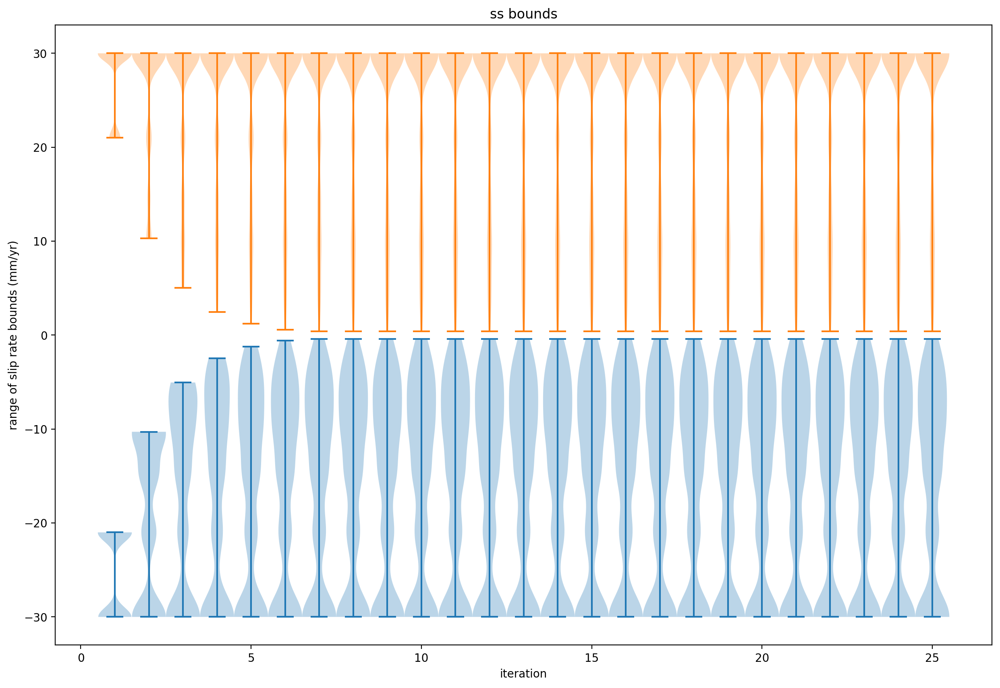

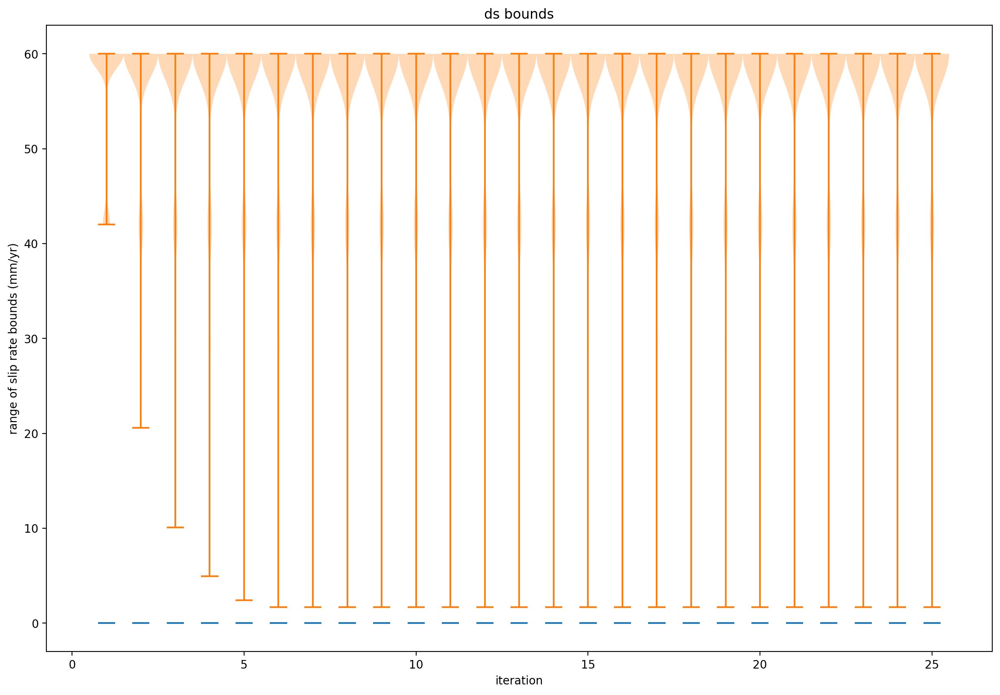

In [11]:
plt.figure(figsize=(15, 10))
plt.violinplot(store_ss_lower[:, 0::2], showmeans=False, showmedians=False, widths=1.0)
plt.violinplot(store_ss_upper[:, 0::2], showmeans=False, showmedians=False, widths=1.0)
plt.xlabel("iteration")
plt.ylabel("range of slip rate bounds (mm/yr)")
plt.title("ss bounds")
plt.show()

plt.figure(figsize=(15, 10))
plt.violinplot(store_ds_lower[:, 0::2], showmeans=False, showmedians=False, widths=1.0)
plt.violinplot(store_ds_upper[:, 0::2], showmeans=False, showmedians=False, widths=1.0)
plt.xlabel("iteration")
plt.ylabel("range of slip rate bounds (mm/yr)")
plt.title("ds bounds")
plt.show()

# Plot complete model result after coupling iterations

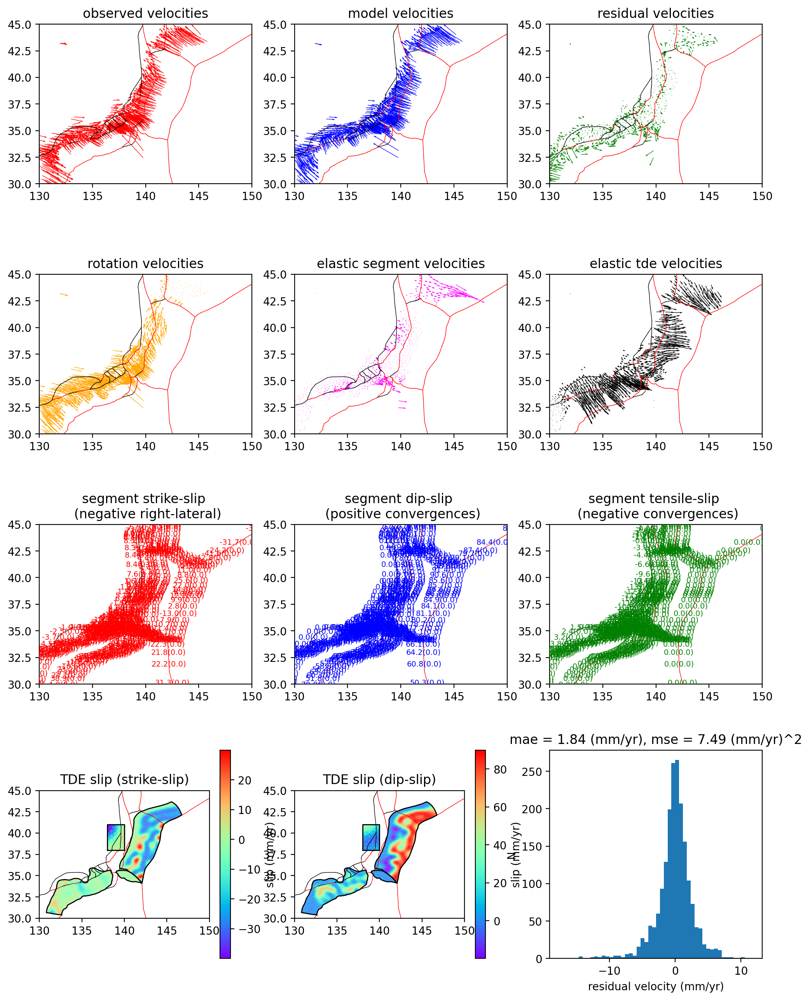

SUCCESS: Wrote figures../runs/0000000519/plot_estimation_summary.(pdf, png) - celeri.celeri:plot_estimation_summary:6601 - 2024-11-17 17:38:32


<Figure size 640x480 with 0 Axes>

In [12]:
celeri.plot_estimation_summary(
    command,
    segment,
    station,
    meshes,
    estimation_qp,
    lon_range=command.lon_range,
    lat_range=command.lat_range,
    quiver_scale=command.quiver_scale,
)

# Plot final slip rates and coupling distributions

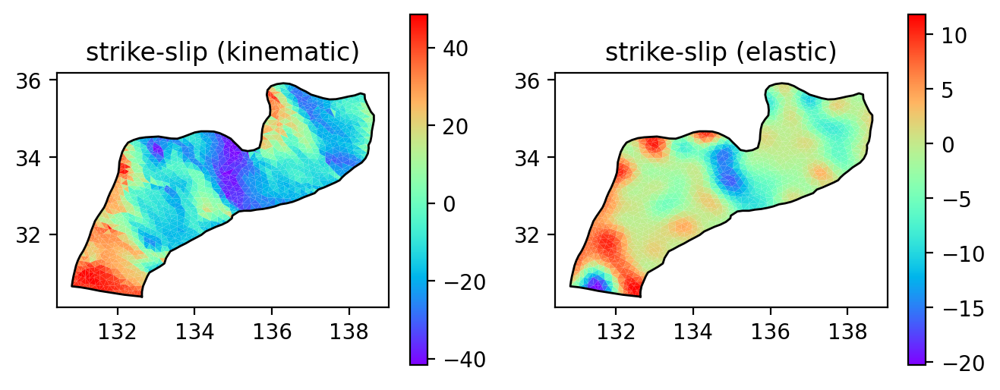

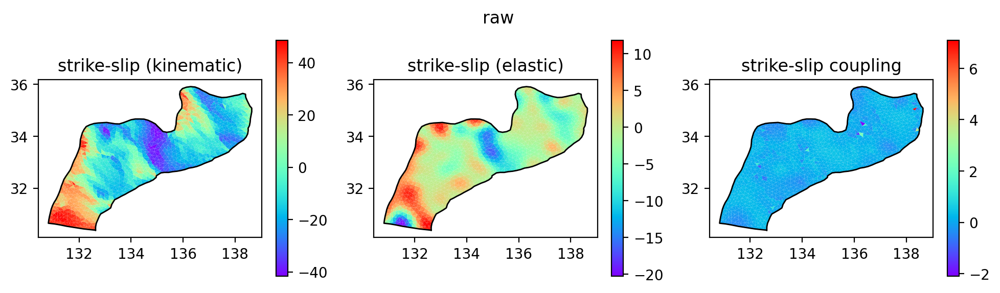

In [13]:
# Multiply rotation vector components by TDE slip rate partials
jpl = (
    operators.rotation_to_tri_slip_rate[0]
    @ estimation_qp.state_vector[0 : 3 * len(block)]
)

# Multiply eigen modes by eigen to TDE matrix
bjm = (
    operators.eigenvectors_to_tde_slip[0]
    @ estimation_qp.state_vector[
        3 * len(block) : 3 * len(block)
        + meshes[0].n_modes_strike_slip
        + meshes[0].n_modes_dip_slip
    ]
)

plt.figure(figsize=(12, 3))
plt.subplot(1, 3, 1)
plot_mesh(meshes[0], jpl[0::2], plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")


# Smooth kinematic smooth
jpl_ss_smooth = smooth_irregular_data(
    meshes[0].lon_centroid, meshes[0].lat_centroid, jpl[0::2], length_scale=0.01
)

jpl_ds_smooth = smooth_irregular_data(
    meshes[0].lon_centroid, meshes[0].lat_centroid, jpl[1::2], length_scale=0.01
)

jpl_ss_smooth[np.abs(jpl_ss_smooth) < 1.0] = 1.0

coupling_ss = bjm[0::2] / np.abs(jpl_ss_smooth)

plt.figure(figsize=(12, 3))
plt.subplot(1, 3, 1)
plot_mesh(meshes[0], jpl[0::2], plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

plt.subplot(1, 3, 3)
plot_mesh(meshes[0], bjm[0::2] / jpl[0::2], plt.gca())
plt.title("strike-slip coupling")
plt.suptitle("raw")
plt.show()

# Calculate length scales of KL modes
- FFT approach gives a garbage answer.  Need to investigate

characteristic_length_scale=0.09 (deg)


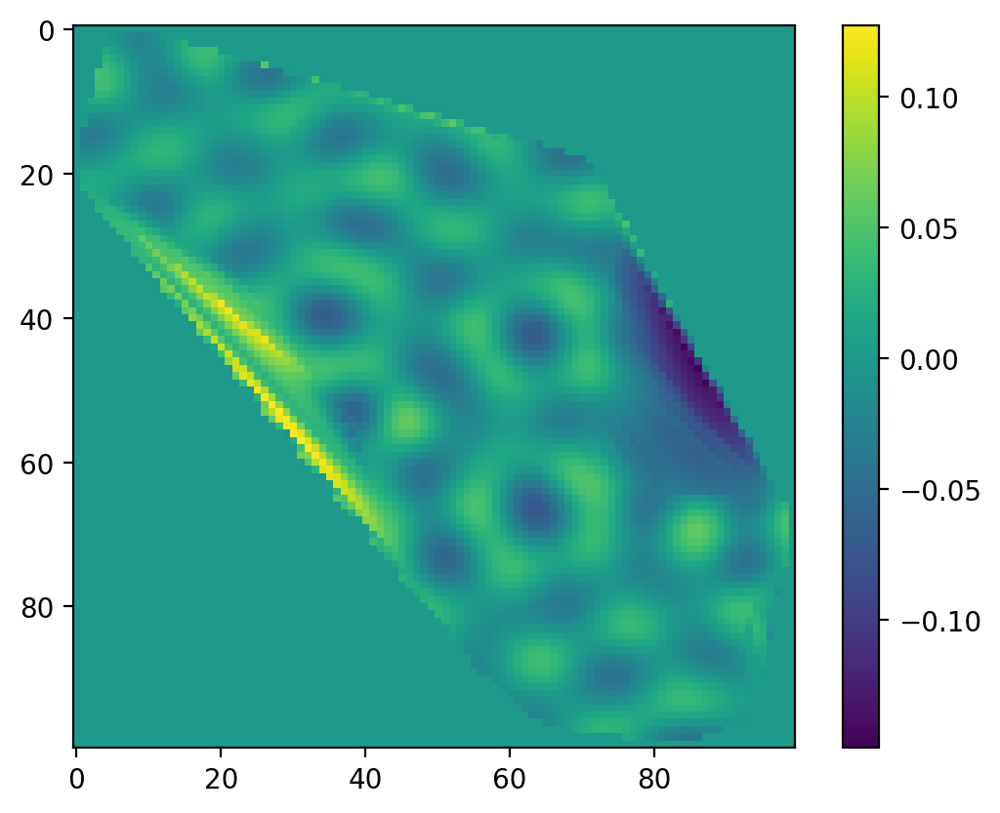

In [14]:
import numpy as np
from scipy.interpolate import griddata
from scipy.fft import fft2, fftshift


scalars = operators.eigenvectors_to_tde_slip[0][1::2, -1]
points = np.vstack((meshes[0].lon_centroid, meshes[0].lat_centroid))

x = meshes[0].lon_centroid
y = meshes[0].lat_centroid
x_min = np.min(x)
y_min = np.min(y)
x_max = np.max(x)
y_max = np.max(y)

# Step 1: Resample data onto a regular grid
# Define grid dimensions and range
grid_x, grid_y = np.mgrid[x_min:x_max:100j, y_min:y_max:100j]
grid_scalars = griddata(points.T, scalars, (grid_x, grid_y), method="cubic")
grid_scalars[np.isnan(grid_scalars)] = 0

# Step 2: Apply 2D Fourier Transform to the gridded data
ft = fft2(grid_scalars, norm="ortho")
ft_shifted = fftshift(ft)  # Shift zero frequency to center for visualization

# Step 3: Calculate the power spectrum (magnitude of the Fourier coefficients)
power_spectrum = np.abs(ft_shifted) ** 2

# Step 4: Identify the dominant spatial frequency
# Find the frequency with the maximum power in the spectrum
ny, nx = power_spectrum.shape
freq_x = np.fft.fftfreq(nx, d=(x_max - x_min) / nx)
freq_y = np.fft.fftfreq(ny, d=(y_max - y_min) / ny)
fx, fy = np.meshgrid(freq_x, freq_y)

# Get indices of the maximum power value (excluding zero frequency)
max_power_idx = np.unravel_index(np.argmax(power_spectrum[1:]), power_spectrum.shape)

# Convert the dominant frequency to a characteristic length scale
dominant_frequency = np.sqrt(fx[max_power_idx] ** 2 + fy[max_power_idx] ** 2)
characteristic_length_scale = 1 / dominant_frequency

print(f"{characteristic_length_scale=:3.2f} (deg)")

plt.imshow(grid_scalars)
plt.colorbar()
plt.show()

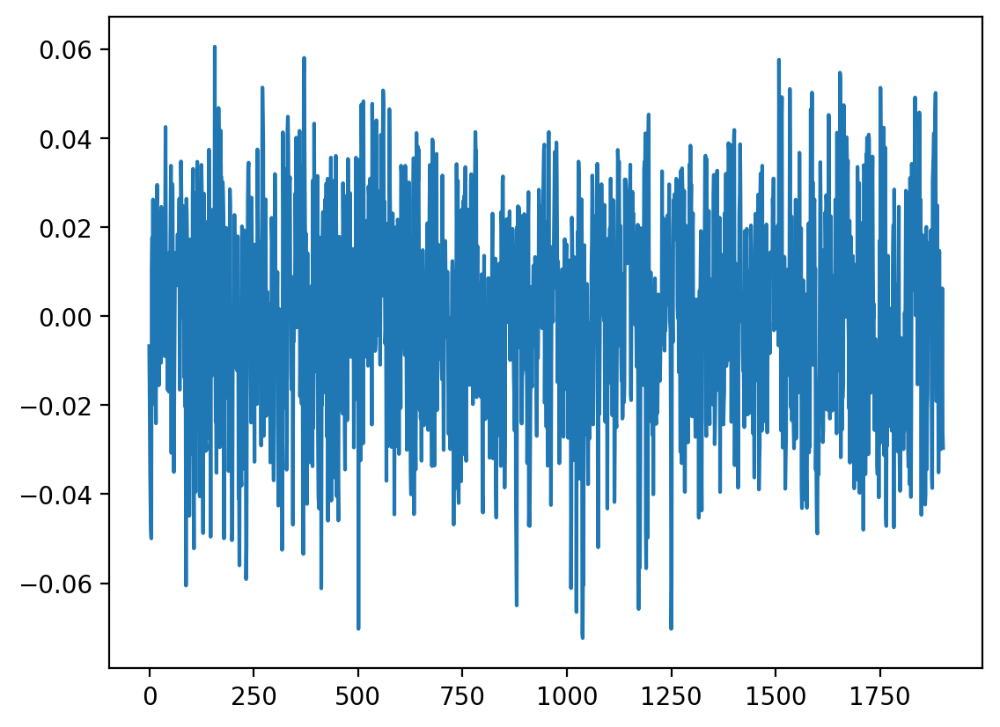

In [15]:
plt.plot(scalars)

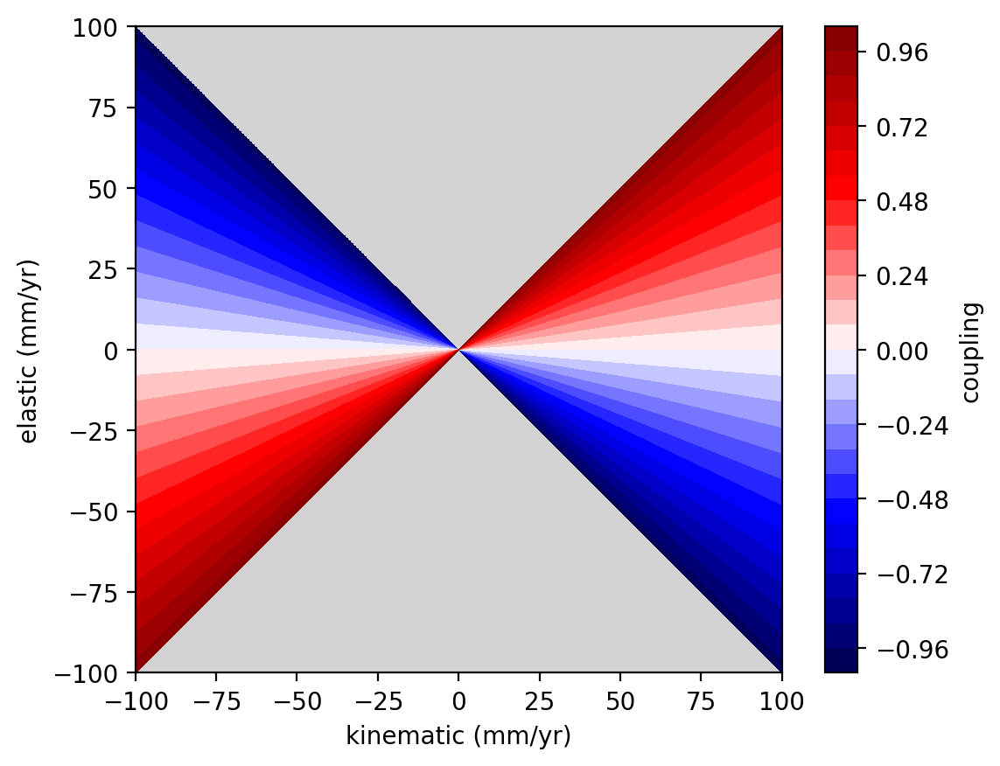

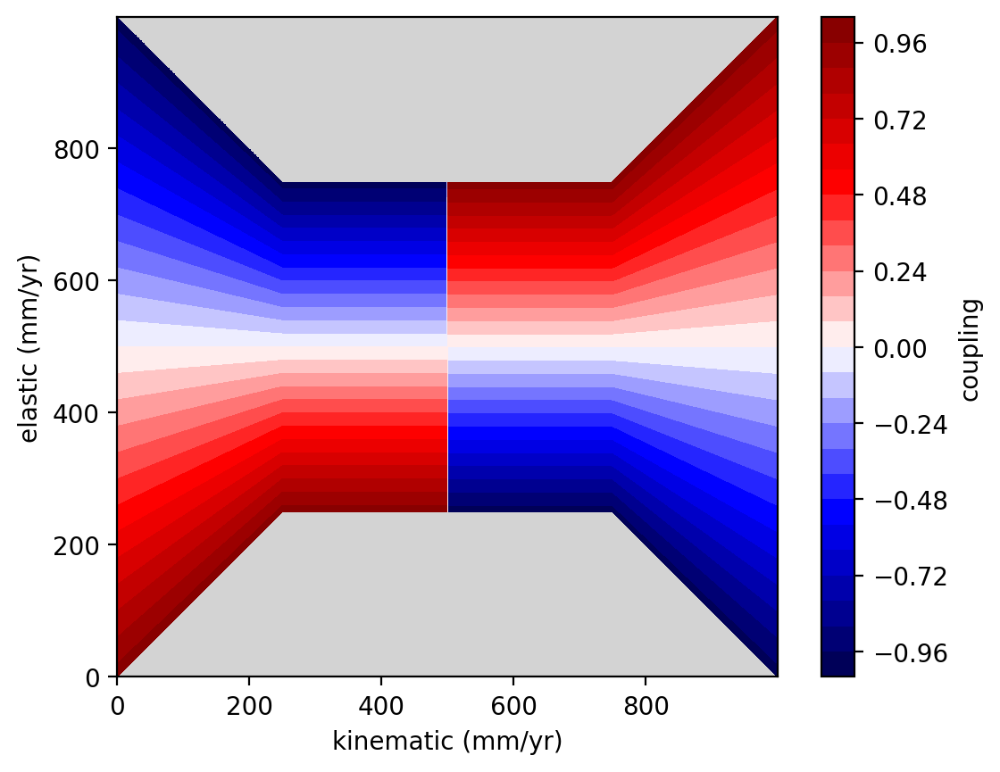

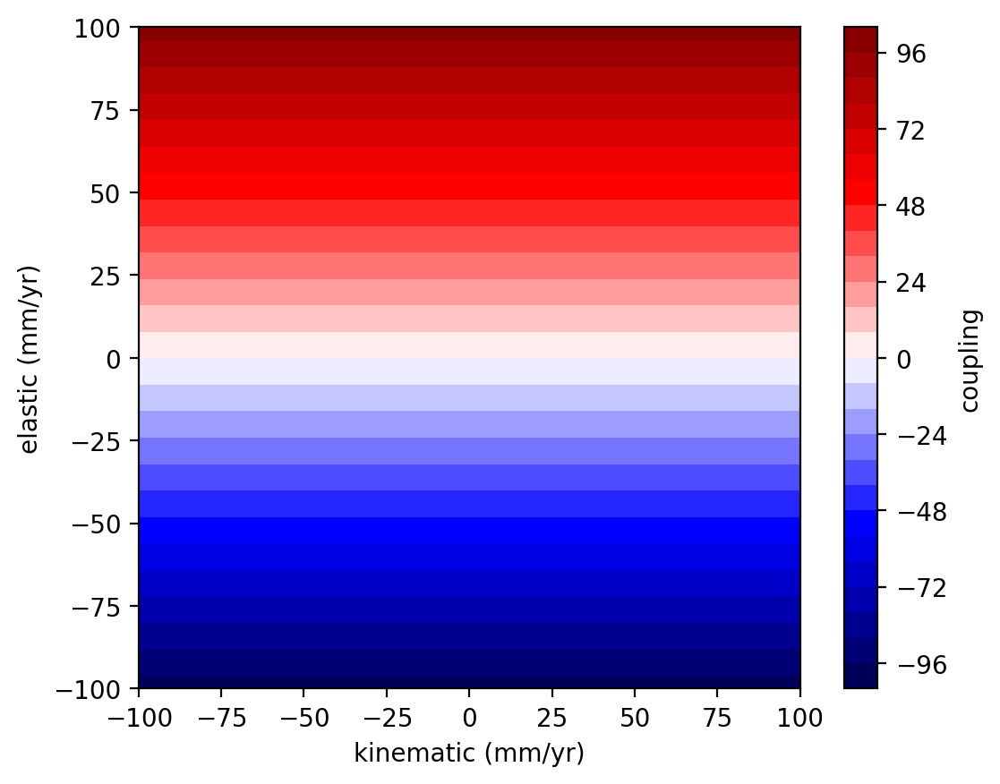

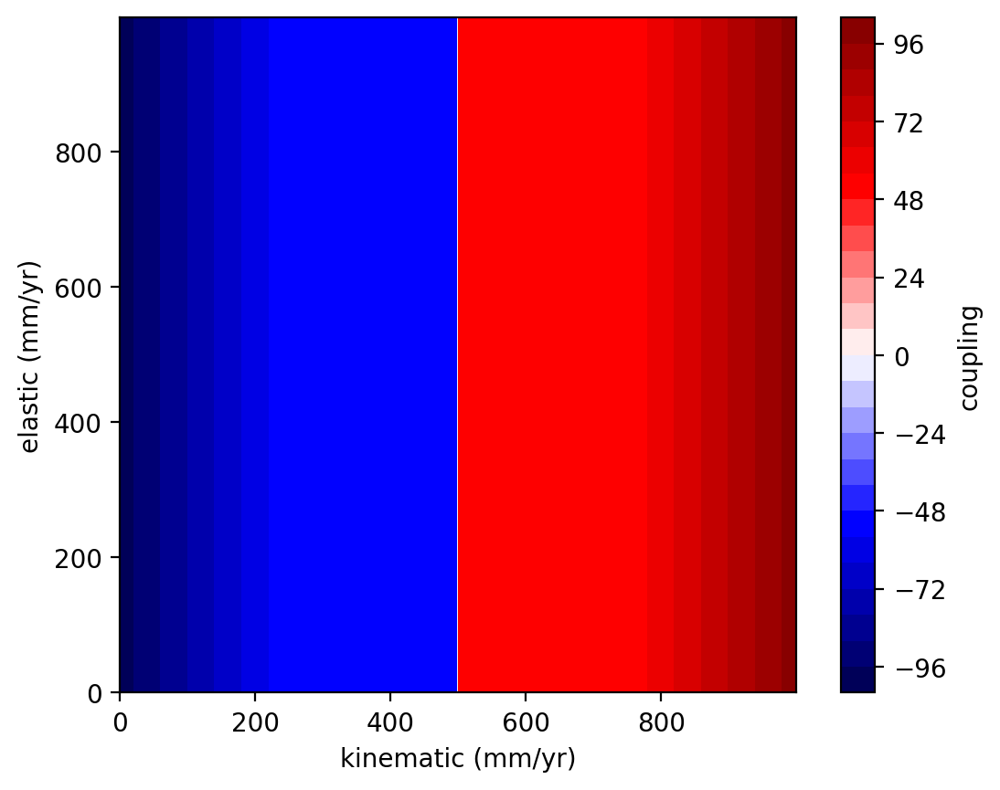

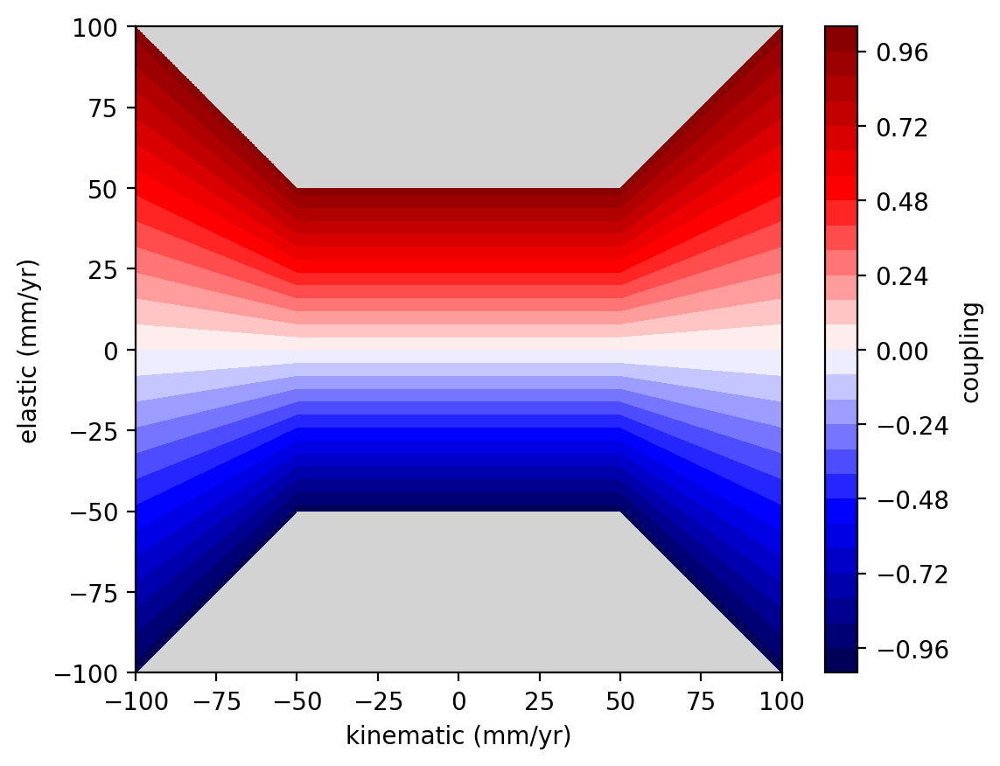

In [16]:
levels = 31
j_cutoff = 50.0

j = np.linspace(-100, 100, 1000)
b = np.linspace(-100, 100, 1000)
j_grid, b_grid = np.meshgrid(j, b)
coupling_grid = b_grid / (j_grid)
coupling_grid[coupling_grid > 1] = np.nan
coupling_grid[coupling_grid < -1] = np.nan
plt.figure()
plt.contourf(j_grid, b_grid, coupling_grid, cmap="seismic", levels=levels)
plt.colorbar(label="coupling")
plt.xlabel("kinematic (mm/yr)")
plt.ylabel("elastic (mm/yr)")
plt.gca().set_aspect("equal")
plt.gca().set_facecolor("lightgray")
plt.show()


j = np.linspace(-100, 100, 1000)
j[np.abs(j) < j_cutoff] = np.sign(j[np.abs(j) < j_cutoff]) * j_cutoff
b = np.linspace(-100, 100, 1000)
j_grid, b_grid = np.meshgrid(j, b)
coupling_grid = b_grid / j_grid
coupling_grid[coupling_grid > 1] = np.nan
coupling_grid[coupling_grid < -1] = np.nan
plt.figure()
plt.contourf(coupling_grid, cmap="seismic", levels=levels)
plt.colorbar(label="coupling")
plt.xlabel("kinematic (mm/yr)")
plt.ylabel("elastic (mm/yr)")
plt.gca().set_aspect("equal")
plt.gca().set_facecolor("lightgray")
plt.show()

plt.figure()
plt.contourf(j_grid, b_grid, b_grid, cmap="seismic", levels=levels)
plt.colorbar(label="coupling")
plt.xlabel("kinematic (mm/yr)")
plt.ylabel("elastic (mm/yr)")
plt.gca().set_aspect("equal")
plt.gca().set_facecolor("lightgray")
plt.show()

plt.figure()
plt.contourf(j_grid, cmap="seismic", levels=levels)
plt.colorbar(label="coupling")
plt.xlabel("kinematic (mm/yr)")
plt.ylabel("elastic (mm/yr)")
plt.gca().set_aspect("equal")
plt.gca().set_facecolor("lightgray")
plt.show()


coupling_grid = b_grid / np.abs(j_grid)
coupling_grid[coupling_grid > 1] = np.nan
coupling_grid[coupling_grid < -1] = np.nan
plt.figure()
plt.contourf(j_grid, b_grid, coupling_grid, cmap="seismic", levels=levels)
plt.colorbar(label="coupling")
plt.xlabel("kinematic (mm/yr)")
plt.ylabel("elastic (mm/yr)")
plt.gca().set_aspect("equal")
plt.gca().set_facecolor("lightgray")
plt.show()

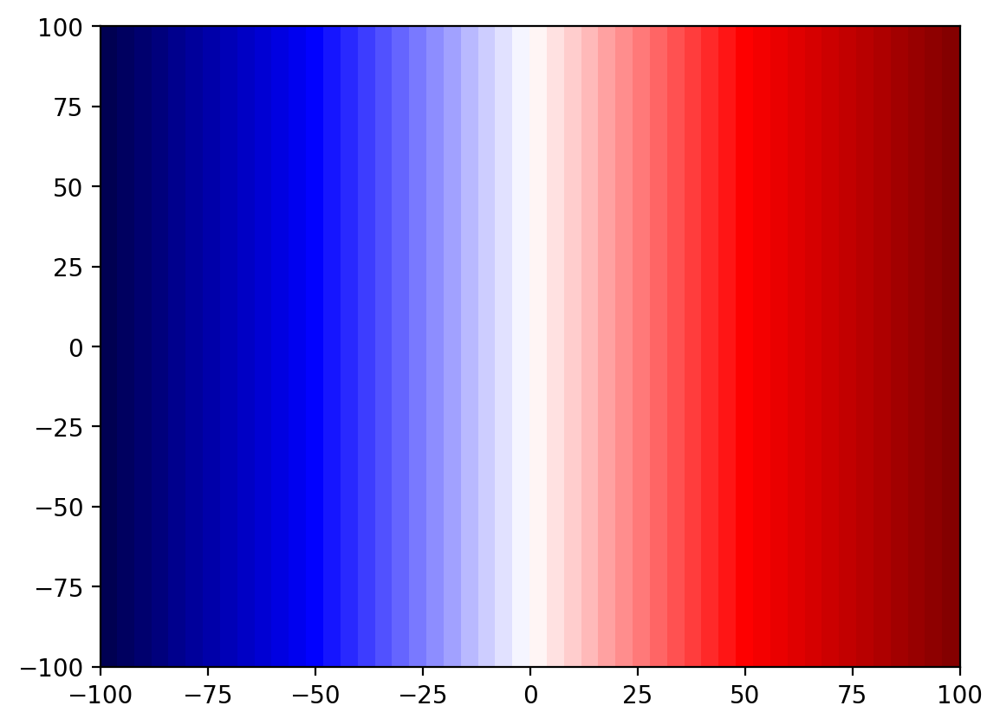

In [17]:
plt.contourf(j, b, j_grid, levels=50, cmap="seismic")

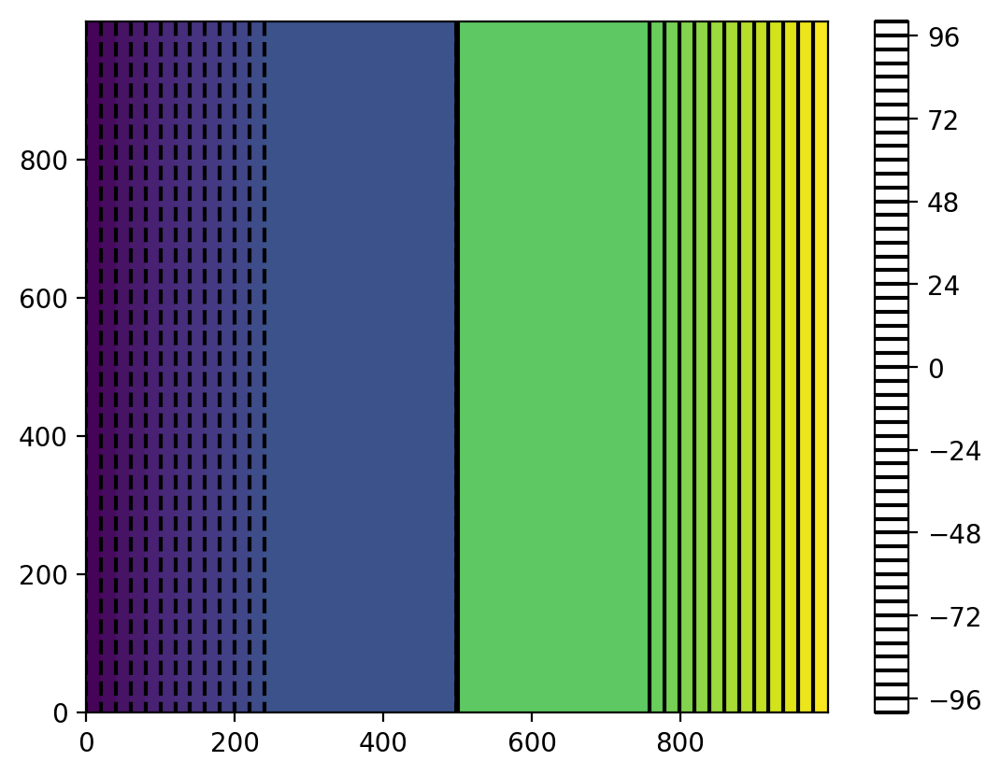

In [18]:
# plt.imshow(np.abs(j_grid))
plt.contourf(j_grid, levels=51)
plt.contour(j_grid, levels=51, colors="k")


plt.colorbar()

# Attempt at integrating coupling into QP constraints

meshes[i].qp_mesh_tde_bound_coupling=1
HELLLOOO
INFO: USING TDE COUPLING BOUNDS FOR MESH 0 - __main__:<module>:58 - 2024-11-17 17:38:35
operators.eigenvectors_to_tde_slip[i].shape=(3804, 200)
operators.rotation_to_tri_slip_rate[i].shape=(3804, 63)


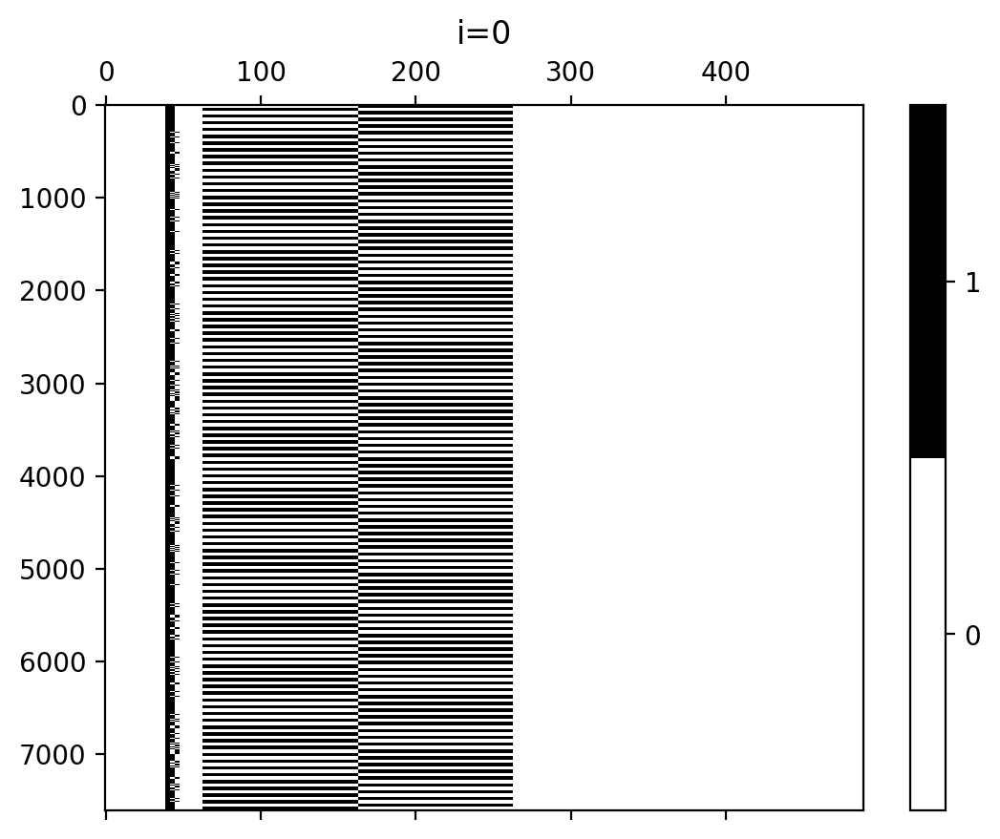

meshes[i].qp_mesh_tde_bound_coupling=0
INFO: USING TDE SLIP RATE BOUNDS FOR MESH 1 - __main__:<module>:12 - 2024-11-17 17:38:35
meshes[i].qp_mesh_tde_bound_coupling=0
INFO: USING TDE SLIP RATE BOUNDS FOR MESH 2 - __main__:<module>:12 - 2024-11-17 17:38:35
meshes[i].qp_mesh_tde_bound_coupling=0
INFO: USING TDE SLIP RATE BOUNDS FOR MESH 3 - __main__:<module>:12 - 2024-11-17 17:38:35


In [19]:
# TODO: REMOVE HAND ADJUSTMENT
meshes[0].qp_mesh_tde_bound = 0
meshes[0].qp_mesh_tde_bound_coupling = 1

# def get_qp_tde_inequality_operator_and_data_vector(index, meshes, operators):
qp_constraint_matrix = np.zeros((4 * index.n_tde_total, index.n_operator_cols_eigen))
qp_constraint_data_vector = np.zeros(4 * index.n_tde_total)

for i in range(index.n_meshes):
    print(f"{meshes[i].qp_mesh_tde_bound_coupling=}")
    if meshes[i].qp_mesh_tde_bound == 1:
        logger.info(f"USING TDE SLIP RATE BOUNDS FOR MESH {i}")

        # TDE strike- and dip-slip rate lower bounds
        lower_bound_current_mesh = celeri.interleave2(
            meshes[i].qp_mesh_tde_slip_rate_lower_bound_ss * np.ones(index.n_tde[i]),
            meshes[i].qp_mesh_tde_slip_rate_lower_bound_ds * np.ones(index.n_tde[i]),
        )

        # TDE strike- and dip-slip rate upper bounds
        upper_bound_current_mesh = celeri.interleave2(
            meshes[i].qp_mesh_tde_slip_rate_upper_bound_ss * np.ones(index.n_tde[i]),
            meshes[i].qp_mesh_tde_slip_rate_upper_bound_ds * np.ones(index.n_tde[i]),
        )

        # Insert TDE lower bounds into QP constraint data vector (note negative sign)
        qp_constraint_data_vector[
            index.qp_constraint_tde_rate_start_row_eigen[
                i
            ] : index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i]
        ] = -lower_bound_current_mesh

        # Insert TDE upper bounds into QP constraint data vector
        qp_constraint_data_vector[
            index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i] : index.qp_constraint_tde_rate_end_row_eigen[i]
        ] = upper_bound_current_mesh

        # Insert eigenmode to TDE slip operator into QP constraint data vector for lower bounds (note negative sign)
        qp_constraint_matrix[
            index.qp_constraint_tde_rate_start_row_eigen[
                i
            ] : index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i],
            index.start_col_eigen[i] : index.end_col_eigen[i],
        ] = -operators.eigenvectors_to_tde_slip[i]

        # Insert eigenmode to TDE slip operator into QP constraint data vector for lower bounds
        qp_constraint_matrix[
            index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i] : index.qp_constraint_tde_rate_end_row_eigen[i],
            index.start_col_eigen[i] : index.end_col_eigen[i],
        ] = operators.eigenvectors_to_tde_slip[i]

    elif meshes[i].qp_mesh_tde_bound_coupling == 1:
        print("HELLLOOO")
        logger.info(f"USING TDE COUPLING BOUNDS FOR MESH {i}")
        # TDE coupling constraints go here
        # TDE strike- and dip-slip coupling lower bounds
        lower_bound_current_mesh = celeri.interleave2(
            meshes[i].qp_mesh_tde_slip_rate_lower_bound_ss_coupling
            * np.ones(index.n_tde[i]),
            meshes[i].qp_mesh_tde_slip_rate_lower_bound_ds_coupling
            * np.ones(index.n_tde[i]),
        )

        # TDE strike- and dip-slip coupling upper bounds
        upper_bound_current_mesh = celeri.interleave2(
            meshes[i].qp_mesh_tde_slip_rate_upper_bound_ss_coupling
            * np.ones(index.n_tde[i]),
            meshes[i].qp_mesh_tde_slip_rate_upper_bound_ds_coupling
            * np.ones(index.n_tde[i]),
        )

        # Insert TDE lower bounds into QP constraint data vector (note negative sign)
        qp_constraint_data_vector[
            index.qp_constraint_tde_rate_start_row_eigen[
                i
            ] : index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i]
        ] = -lower_bound_current_mesh

        # Insert TDE upper bounds into QP constraint data vector
        qp_constraint_data_vector[
            index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i] : index.qp_constraint_tde_rate_end_row_eigen[i]
        ] = upper_bound_current_mesh

        # Insert eigenmode to TDE slip operator into QP constraint data vector for lower bounds (note negative sign)
        qp_constraint_matrix[
            index.qp_constraint_tde_rate_start_row_eigen[
                i
            ] : index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i],
            index.start_col_eigen[i] : index.end_col_eigen[i],
        ] = -operators.eigenvectors_to_tde_slip[i]

        # Insert eigenmode to TDE slip operator into QP constraint data vector for lower bounds
        qp_constraint_matrix[
            index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i] : index.qp_constraint_tde_rate_end_row_eigen[i],
            index.start_col_eigen[i] : index.end_col_eigen[i],
        ] = operators.eigenvectors_to_tde_slip[i]

        # Insert TDE slip rate rotation partials
        # Insert TDE slip rate partials into QP constraint data vector for lower bounds (note negative sign)
        print(f"{operators.eigenvectors_to_tde_slip[i].shape=}")
        print(f"{operators.rotation_to_tri_slip_rate[i].shape=}")

        qp_constraint_matrix[
            index.qp_constraint_tde_rate_start_row_eigen[
                i
            ] : index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i],
            0 : index.start_col_eigen[i],
        ] = -operators.rotation_to_tri_slip_rate[i]

        qp_constraint_matrix[
            index.qp_constraint_tde_rate_start_row_eigen[i]
            + 2 * index.n_tde[i] : index.qp_constraint_tde_rate_end_row_eigen[i],
            0 : index.start_col_eigen[i],
        ] = operators.rotation_to_tri_slip_rate[i]

        to_plot = qp_constraint_matrix[
            index.qp_constraint_tde_rate_start_row_eigen[
                i
            ] : index.qp_constraint_tde_rate_end_row_eigen[i],
            :,
        ]
        plt.figure()
        plt.spy(to_plot, aspect="auto")
        plt.title(f"{i=}")
        plt.colorbar()
        plt.show()


# # HACK
# qp_constraint_matrix[
#     index.qp_constraint_tde_rate_start_row_eigen[
#         0
#     ] : index.qp_constraint_tde_rate_end_row_eigen[0],
#     :,
# ] *= 1e-3

# return qp_constraint_matrix, qp_constraint_data_vector

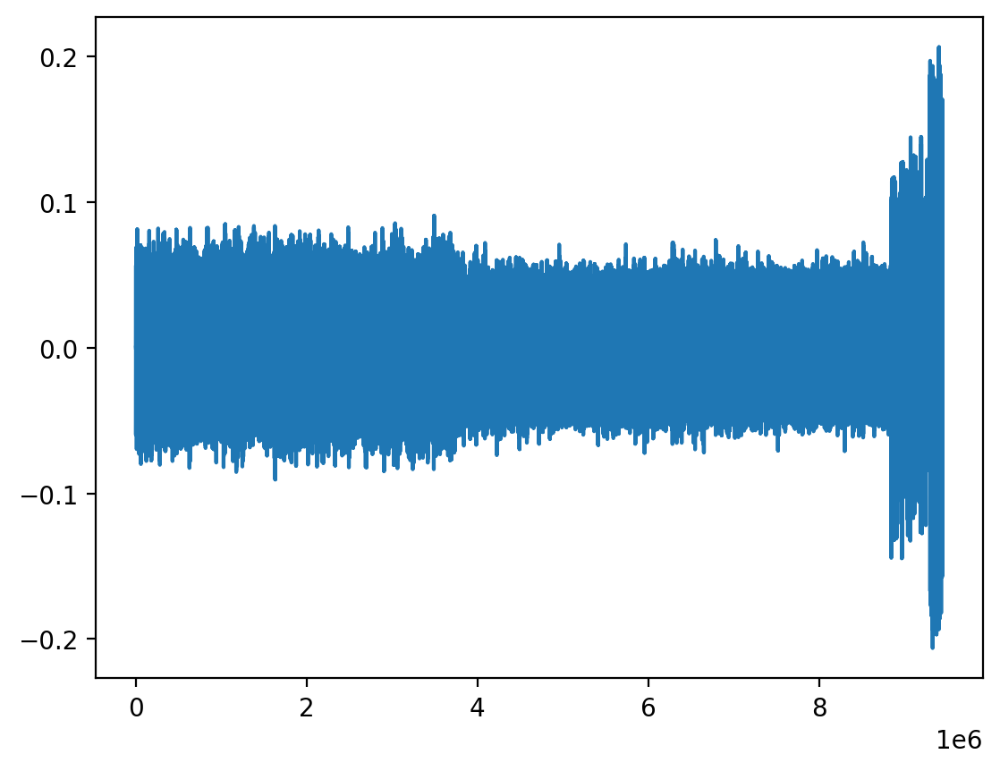

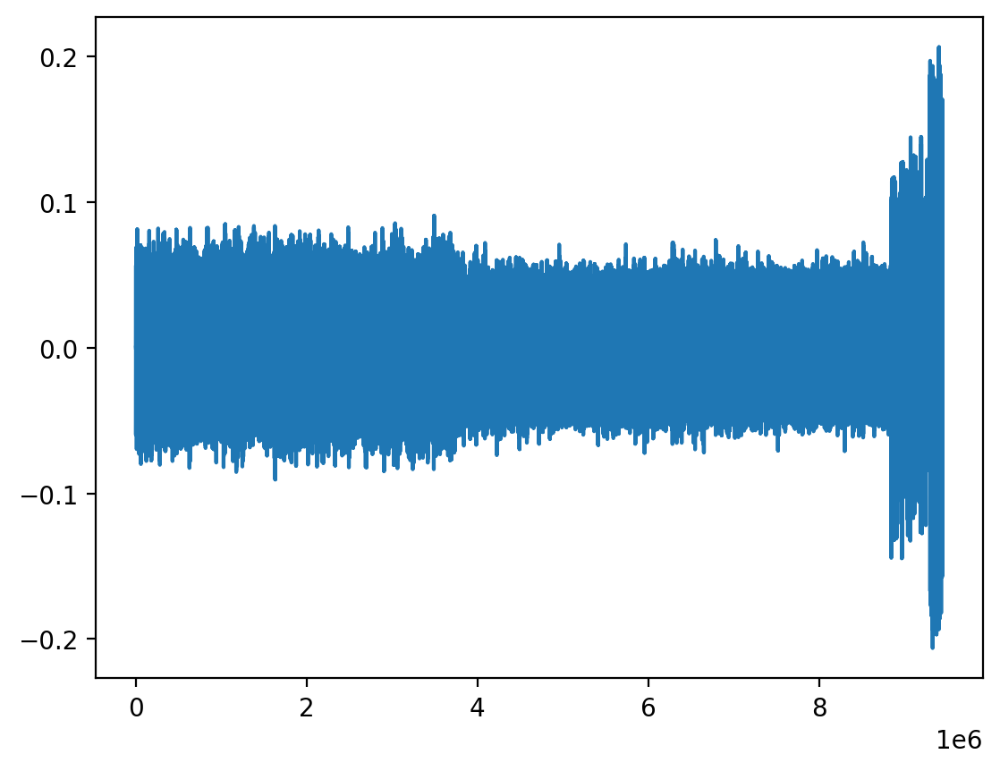

     pcost       dcost       gap    pres   dres
 0: -2.8573e+04 -2.0805e+07  2e+07  5e-02  2e+02
 1: -3.5679e+04 -1.4007e+07  2e+07  3e-02  1e+02
 2: -3.5593e+04 -1.3923e+07  2e+07  3e-02  1e+02
 3: -3.5325e+04 -1.3695e+07  2e+07  3e-02  1e+02
 4: -3.5155e+04 -1.3142e+07  1e+07  3e-02  1e+02
 5: -3.5011e+04 -1.1458e+07  1e+07  2e-02  8e+01
 6: -3.5845e+04 -8.5315e+06  1e+07  1e-02  5e+01
 7: -4.2873e+04 -9.5848e+05  1e+06  7e-04  3e+00
 8: -4.5156e+04 -2.5286e+05  2e+05  2e-04  6e-01
 9: -4.6336e+04 -1.2891e+05  9e+04  5e-05  2e-01
10: -4.7209e+04 -5.6537e+04  1e+04  5e-06  2e-02
11: -4.7641e+04 -4.9227e+04  2e+03  7e-07  3e-03
12: -4.7775e+04 -4.8161e+04  4e+02  1e-07  5e-04
13: -4.7798e+04 -4.8057e+04  3e+02  7e-08  3e-04
14: -4.7815e+04 -4.7934e+04  1e+02  3e-08  1e-04
15: -4.7819e+04 -4.7895e+04  9e+01  1e-08  5e-05
16: -4.7822e+04 -4.7858e+04  4e+01  4e-09  3e-05
17: -4.7823e+04 -4.7847e+04  3e+01  2e-09  2e-05
18: -4.7823e+04 -4.7832e+04  1e+01  4e-10  4e-05
19: -4.7824e+04 -4.78

In [20]:
ss_bounds_lower = meshes[0].qp_mesh_tde_slip_rate_lower_bound_ss_coupling * np.ones(
    meshes[0].n_tde
)
ss_bounds_upper = (
    -1.0
    * meshes[0].qp_mesh_tde_slip_rate_upper_bound_ss_coupling
    * np.ones(meshes[0].n_tde)
)
ds_bounds_lower = meshes[0].qp_mesh_tde_slip_rate_lower_bound_ds_coupling * np.ones(
    meshes[0].n_tde
)
ds_bounds_upper = (
    -1.0
    * meshes[0].qp_mesh_tde_slip_rate_upper_bound_ds_coupling
    * np.ones(meshes[0].n_tde)
)

# Build and insert update slip rate bounds into QP inequality vector
lower_bounds = celeri.interleave2(ss_bounds_lower, ds_bounds_lower)
upper_bounds = celeri.interleave2(ss_bounds_upper, ds_bounds_upper)
bounds = np.hstack((lower_bounds, upper_bounds))
updated_qp_inequality_constraints_data_vector = np.copy(
    qp_inequality_constraints_data_vector
)
updated_qp_inequality_constraints_data_vector[0 : 4 * meshes[0].n_tde] = 0.0

# Extract the rotation component columns from the Nankai mesh
# rot_sub_mat = qp_constraint_matrix[
#     index.qp_constraint_tde_rate_start_row_eigen[
#         0
#     ] : index.qp_constraint_tde_rate_end_row_eigen[0],
#     0 : 3 * len(block),
# ]

# Scale rows of rotation matrix by coupling coefficients
# rot_sub_mat_coup = rot_sub_mat * bounds[:, np.newaxis]

# # Insert coupling scaled rotation matrix back into
# qp_constraint_matrix[
#     index.qp_constraint_tde_rate_start_row_eigen[
#         0
#     ] : index.qp_constraint_tde_rate_end_row_eigen[0],
#     0 : 3 * len(block),
# ] = rot_sub_mat_coup

# Extract the rotation component columns from the Nankai mesh
rot_sub_mat = qp_constraint_matrix[
    index.qp_constraint_tde_rate_start_row_eigen[
        0
    ] : index.qp_constraint_tde_rate_end_row_eigen[0],
    0 : 3 * len(block),
]

# Scale rows of rotation matrix by coupling coefficients
rot_sub_mat_coup = rot_sub_mat * bounds[:, np.newaxis]

# Insert coupling scaled rotation matrix back into
updated_qp_constraint_matrix = np.copy(qp_inequality_constraints_matrix)

plt.figure()
plt.plot(qp_inequality_constraints_matrix.flatten())
plt.show()

plt.figure()
plt.plot(updated_qp_constraint_matrix.flatten())
plt.show()

updated_qp_constraint_matrix[
    index.qp_constraint_tde_rate_start_row_eigen[
        0
    ] : index.qp_constraint_tde_rate_end_row_eigen[0],
    0 : 3 * len(block),
] = rot_sub_mat_coup

# QP solve with updated TDE slip rate constraints
solution_qp = celeri.lsqlin_qp(
    operators.eigen * np.sqrt(weighting_vector_eigen[:, None]),
    data_vector_eigen * np.sqrt(weighting_vector_eigen),
    0,
    updated_qp_constraint_matrix,  # Inequality matrix
    updated_qp_inequality_constraints_data_vector,  # Inequality data vector
    None,
    None,
    None,
    None,
    None,
    {"show_progress": True},
)

# Create estimation data structure and calculate derived quantities
estimation_qp.state_vector = np.array(solution_qp["x"]).flatten()
estimation_qp.operator = operators.eigen
celeri.post_process_estimation_eigen(estimation_qp, operators, station, index)

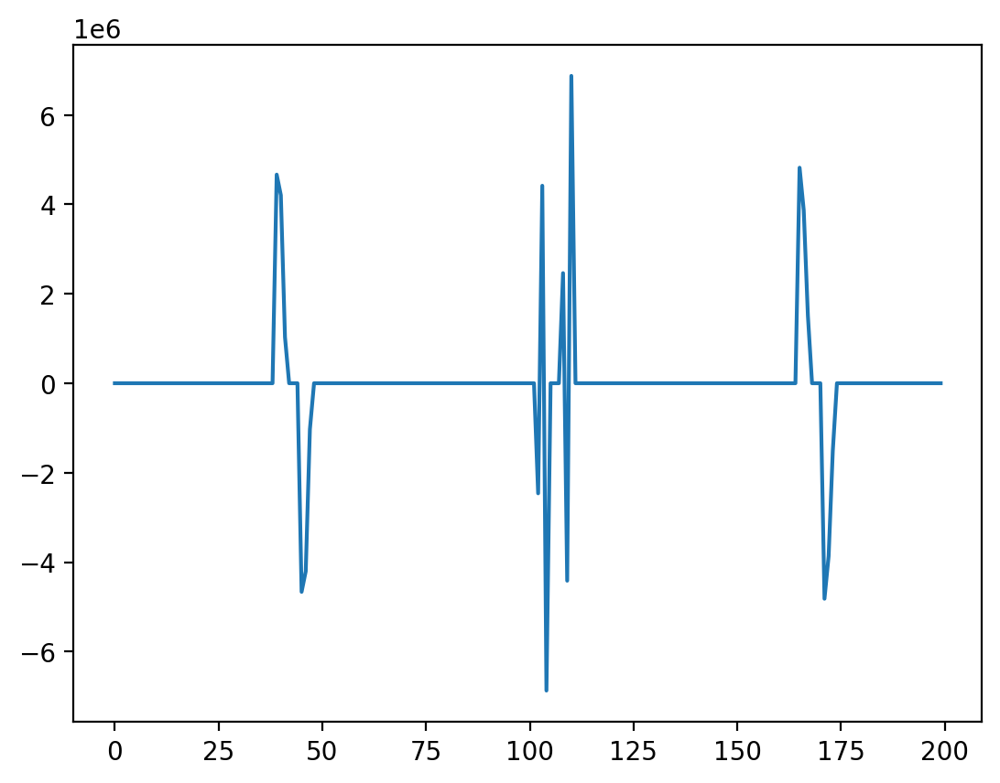

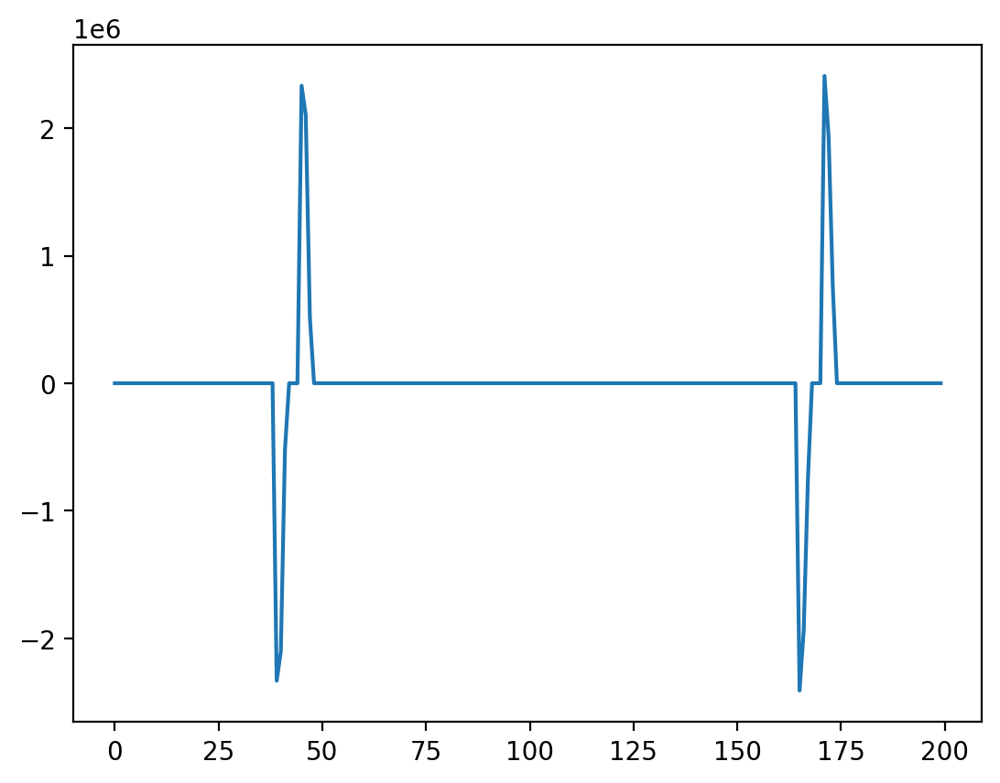

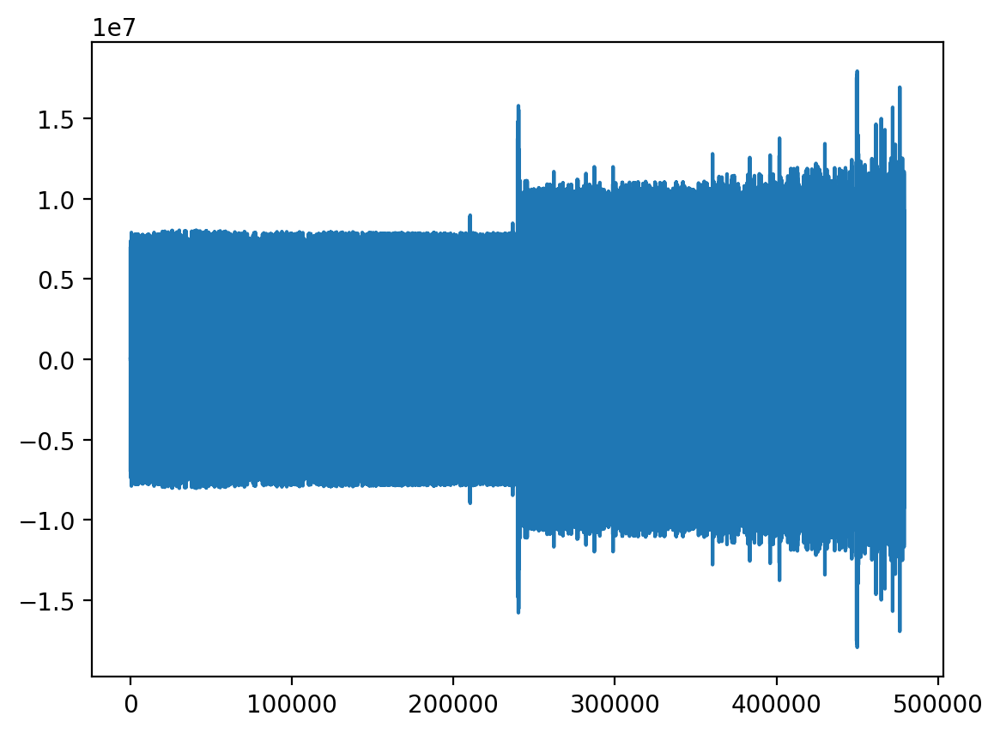

In [21]:
plt.figure()
plt.plot(rot_sub_mat.flatten()[0:200])
plt.show()

plt.figure()
plt.plot(rot_sub_mat_coup.flatten()[0:200])
plt.show()

plt.figure()
plt.plot(rot_sub_mat.flatten() - rot_sub_mat_coup.flatten())
plt.show()

/var/folders/pq/qqjshcd51vg5t9w5ws8wkmw00000gn/T/ipykernel_67998/866467320.py:7: RuntimeWarning: divide by zero encountered in log10
  plt.plot(np.log10(np.abs(qp_inequality_constraints_matrix.flatten())))


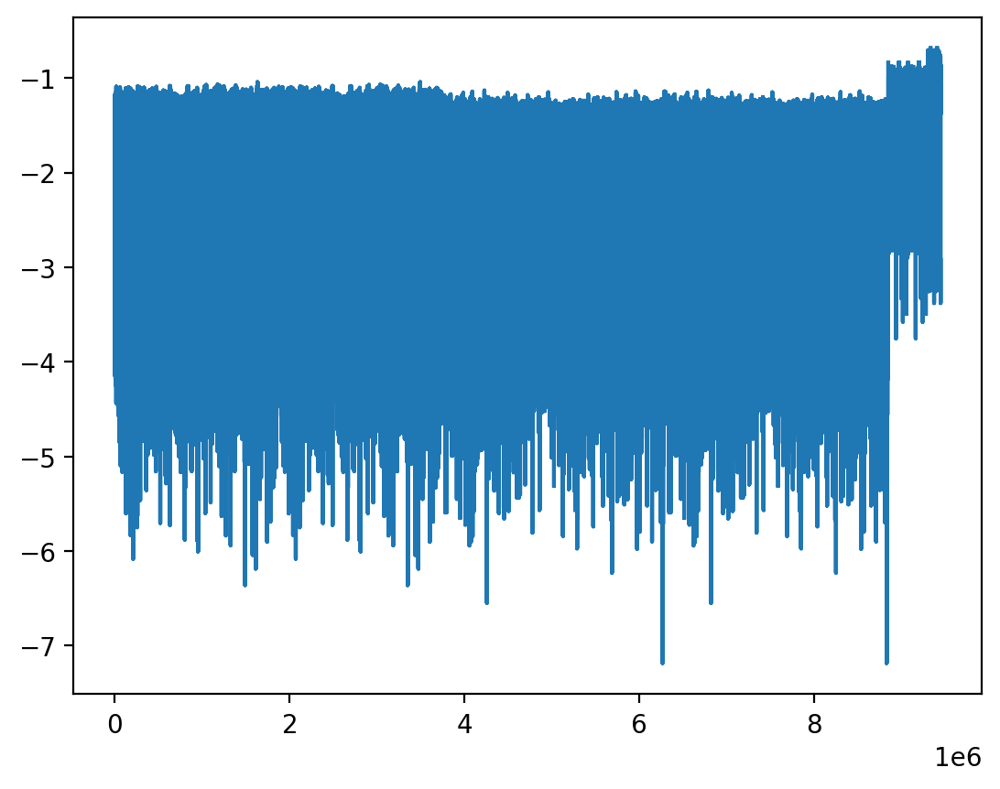

/var/folders/pq/qqjshcd51vg5t9w5ws8wkmw00000gn/T/ipykernel_67998/866467320.py:11: RuntimeWarning: divide by zero encountered in log10
  plt.plot(np.log10(np.abs(qp_constraint_matrix.flatten())))


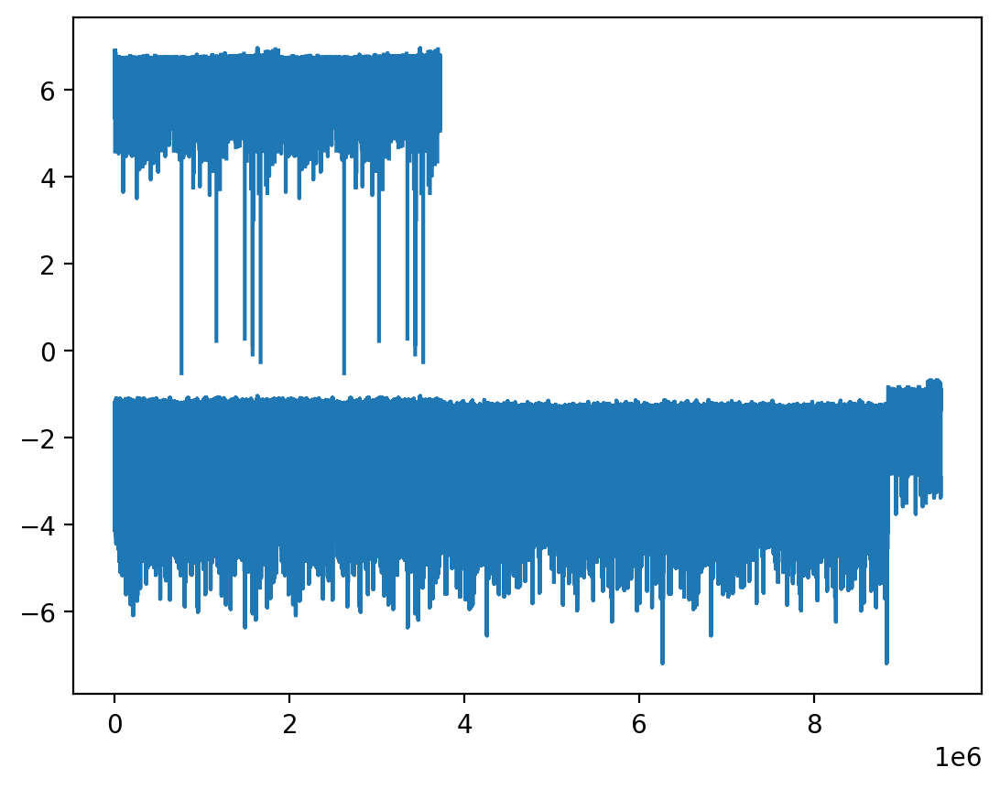

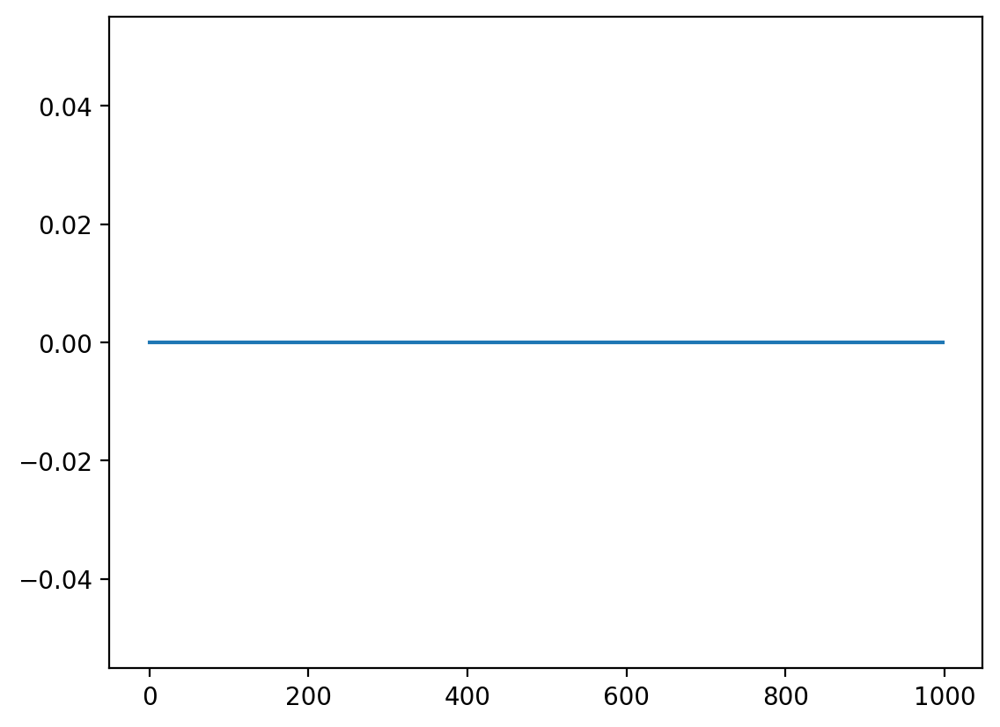

In [22]:
# plt.plot(updated_qp_inequality_constraints_data_vector, "+r")
# plt.plot(updated_qp_inequality_constraints_data_vector - qp_inequality_constraints_data_vector, ".b")
# plt.show()


plt.figure()
plt.plot(np.log10(np.abs(qp_inequality_constraints_matrix.flatten())))
plt.show()

plt.figure()
plt.plot(np.log10(np.abs(qp_constraint_matrix.flatten())))
plt.show()

plt.figure()
a = qp_inequality_constraints_matrix.flatten() - qp_constraint_matrix.flatten()

plt.plot(a[-1000:-1])
plt.show()

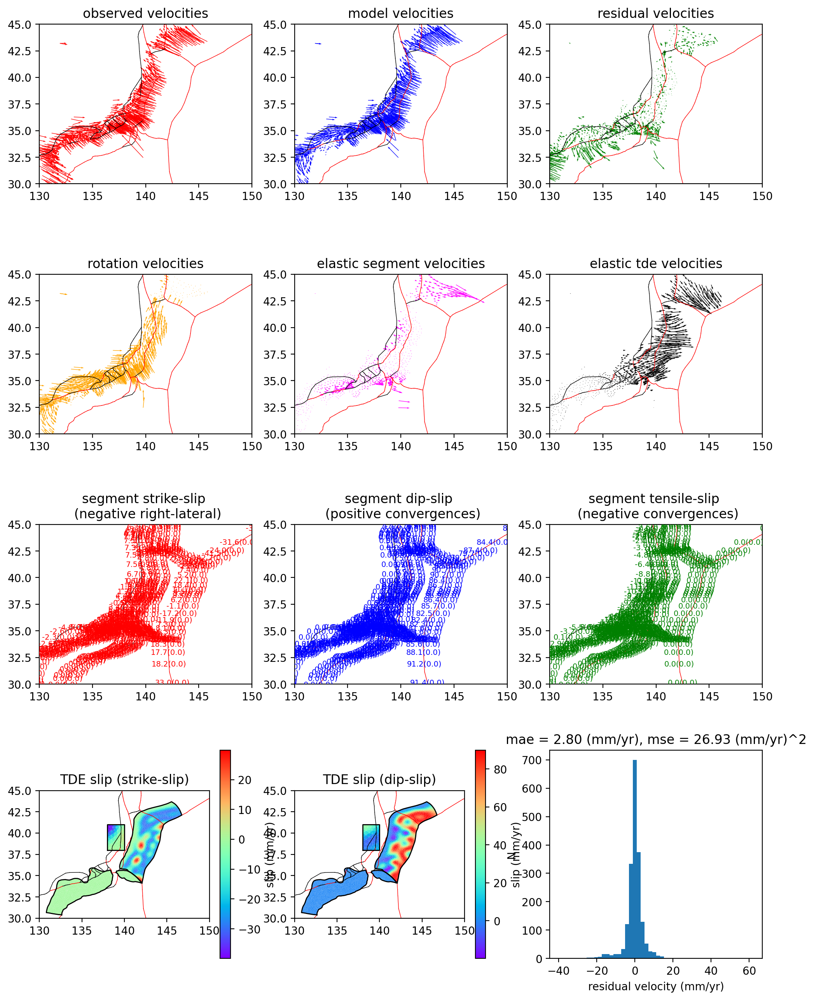

SUCCESS: Wrote figures../runs/0000000519/plot_estimation_summary.(pdf, png) - celeri.celeri:plot_estimation_summary:6601 - 2024-11-17 17:38:44


<Figure size 640x480 with 0 Axes>

In [23]:
celeri.plot_estimation_summary(
    command,
    segment,
    station,
    meshes,
    estimation_qp,
    lon_range=command.lon_range,
    lat_range=command.lat_range,
    quiver_scale=command.quiver_scale,
)

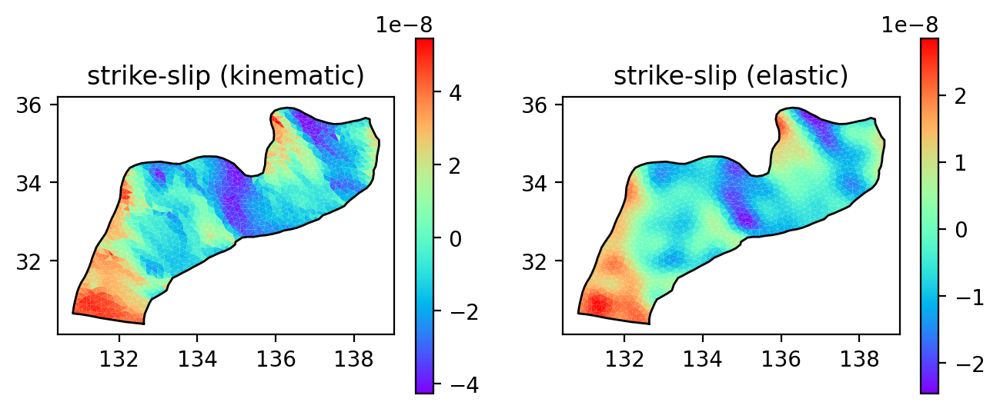

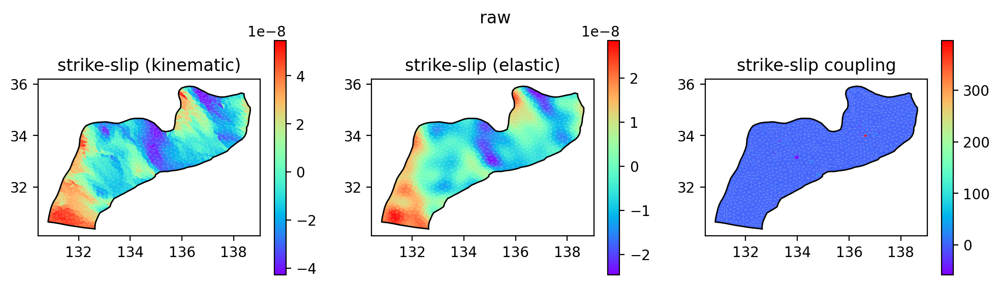

In [24]:
# Multiply rotation vector components by TDE slip rate partials
jpl = (
    operators.rotation_to_tri_slip_rate[0]
    @ estimation_qp.state_vector[0 : 3 * len(block)]
)

# Multiply eigen modes by eigen to TDE matrix
bjm = (
    operators.eigenvectors_to_tde_slip[0]
    @ estimation_qp.state_vector[
        3 * len(block) : 3 * len(block)
        + meshes[0].n_modes_strike_slip
        + meshes[0].n_modes_dip_slip
    ]
)

plt.figure(figsize=(12, 3))
plt.subplot(1, 3, 1)
plot_mesh(meshes[0], jpl[0::2], plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")


# Smooth kinematic smooth
# jpl_ss_smooth = smooth_irregular_data(
#     meshes[0].lon_centroid, meshes[0].lat_centroid, jpl[0::2], length_scale=0.01
# )

# jpl_ds_smooth = smooth_irregular_data(
#     meshes[0].lon_centroid, meshes[0].lat_centroid, jpl[1::2], length_scale=0.01
# )

# jpl_ss_smooth[np.abs(jpl_ss_smooth) < 1.0] = 1.0

coupling_ss = bjm[0::2] / jpl[0::2]

plt.figure(figsize=(12, 3))
plt.subplot(1, 3, 1)
plot_mesh(meshes[0], jpl[0::2], plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

plt.subplot(1, 3, 3)
# plot_mesh(meshes[0], np.log10(np.abs(coupling_ss)), plt.gca())
plot_mesh(meshes[0], coupling_ss, plt.gca())
plt.title("strike-slip coupling")
plt.suptitle("raw")
plt.show()

# Can I build a linear smoothing operator?


In [25]:
def gaussian_kernel(x, y, x_i, y_i, sigma_x, sigma_y):
    """
    Compute the Gaussian kernel value between (x, y) and (x_i, y_i).
    """
    return np.exp(
        -((x - x_i) ** 2 / (2 * sigma_x**2) + (y - y_i) ** 2 / (2 * sigma_y**2))
    )


def build_linear_operator(x, y, grid_x, grid_y, sigma_x, sigma_y):
    """
    Build the linear operator A for smoothing.

    Parameters:
    - x, y: Arrays of the coordinates of the data points.
    - grid_x, grid_y: 2D arrays defining the grid where smoothed values are computed.
    - sigma_x, sigma_y: Standard deviations of the Gaussian kernel in x and y directions.

    Returns:
    - A: Linear operator matrix of shape (num_grid_points, num_data_points).
    """
    num_data_points = len(x)
    num_grid_points = grid_x.size
    A = np.zeros((num_grid_points, num_data_points))

    for i, (gx, gy) in enumerate(zip(grid_x.ravel(), grid_y.ravel())):
        for j, (xi, yi) in enumerate(zip(x, y)):
            A[i, j] = gaussian_kernel(gx, gy, xi, yi, sigma_x, sigma_y)

    # Normalize each row to ensure proper smoothing
    row_sums = A.sum(axis=1, keepdims=True)
    A /= row_sums
    return A

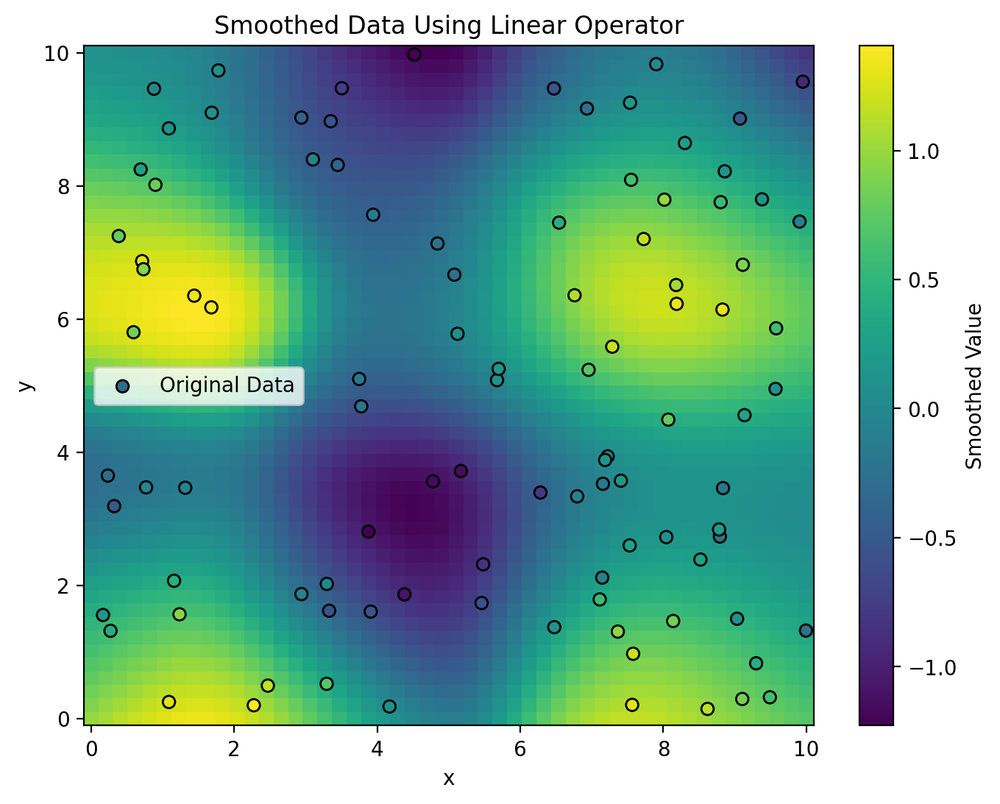

In [26]:
# Example data
x = np.random.rand(100) * 10  # x-coordinates of data points
y = np.random.rand(100) * 10  # y-coordinates of data points
s = np.sin(x) + np.cos(y) + np.random.normal(0, 0.2, size=100)  # noisy data values

# Define the grid for smoothing
grid_x, grid_y = np.meshgrid(np.linspace(0, 10, 50), np.linspace(0, 10, 50))

# Smoothing parameters
sigma_x = 1.0
sigma_y = 1.0

# Build the linear operator
A = build_linear_operator(x, y, grid_x, grid_y, sigma_x, sigma_y)

# Apply the smoothing operator
s_smooth = A @ s

# Reshape the smoothed data to match the grid
s_smooth_grid = s_smooth.reshape(grid_x.shape)

# Visualization (optional)
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.pcolormesh(grid_x, grid_y, s_smooth_grid, shading="auto", cmap="viridis")
plt.colorbar(label="Smoothed Value")
plt.scatter(x, y, c=s, cmap="viridis", edgecolor="k", label="Original Data")
plt.legend()
plt.title("Smoothed Data Using Linear Operator")
plt.xlabel("x")
plt.ylabel("y")
plt.show()

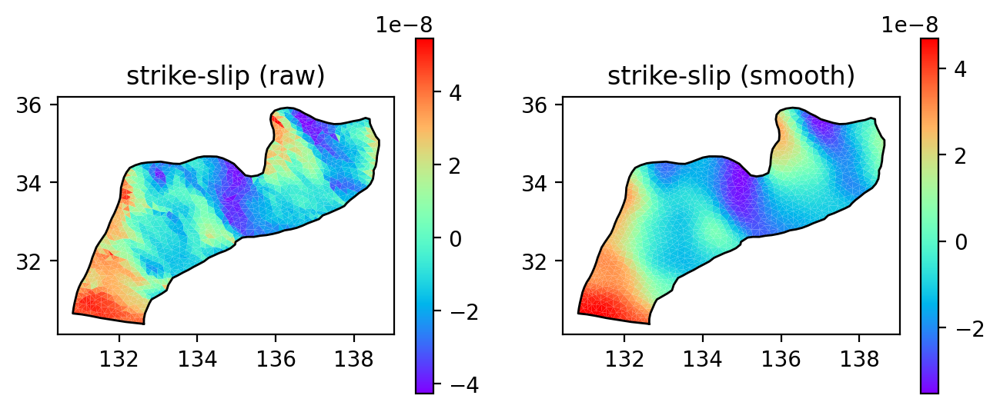

In [ ]:
# Build the linear operator
linear_smoothing_matrix = build_linear_operator(
    meshes[0].lon_centroid,
    meshes[0].lat_centroid,
    meshes[0].lon_centroid,
    meshes[0].lat_centroid,
    sigma_x=0.25,
    sigma_y=0.25,
)

# Apply the smoothing operator
jpl_ss_smooth = linear_smoothing_matrix @ jpl[0::2]

plt.figure(figsize=(12, 3))
plt.subplot(1, 3, 1)
plot_mesh(meshes[0], jpl[0::2], plt.gca())
plt.title("strike-slip (raw)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], jpl_ss_smooth, plt.gca())
plt.title("strike-slip (smooth)")
plt.show()

In [38]:
A.shape

(1902, 1902)